<a href="https://colab.research.google.com/github/machiwao/CCADMACL_PROJECT_COM222/blob/judiciary/CCADMACL_Project_Implementation_extracted%20outliers.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Multidimensinal Poverty Measures
Dataset Reference: https://www.kaggle.com/datasets/grosvenpaul/family-income-and-expenditure/data

1.   How do income and spending patterns vary across different regions in the Philippines?
2.   Can we identify clusters of regions with similar economic characteristics?
3. What are the distinguishing characteristics of each cluster in terms of spending habits?


In [992]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np4
from sklearn.preprocessing import StandardScaler, LabelEncoder, MinMaxScaler, normalize
from imblearn.under_sampling import TomekLinks
from sklearn.model_selection import train_test_split

# Data Loading

In [993]:
df = pd.read_csv('https://raw.githubusercontent.com/machiwao/CCADMACL_PROJECT_COM222/refs/heads/main/Family%20Income%20and%20Expenditure.csv')
df.head()

,Total Household Income,Region,Total Food Expenditure,Main Source of Income,Agricultural Household indicator,Bread and Cereals Expenditure,Total Rice Expenditure,Meat Expenditure,Total Fish and marine products Expenditure,Fruit Expenditure,...,Number of Refrigerator/Freezer,Number of Washing Machine,Number of Airconditioner,"Number of Car, Jeep, Van",Number of Landline/wireless telephones,Number of Cellular phone,Number of Personal Computer,Number of Stove with Oven/Gas Range,Number of Motorized Banca,Number of Motorcycle/Tricycle
0,480332,CAR,117848,Wage/Salaries,0,42140,38300,24676,16806,3325,...,1,1,0,0,0,2,1,0,0,1
1,198235,CAR,67766,Wage/Salaries,0,17329,13008,17434,11073,2035,...,0,1,0,0,0,3,1,0,0,2
2,82785,CAR,61609,Wage/Salaries,1,34182,32001,7783,2590,1730,...,0,0,0,0,0,0,0,0,0,0
3,107589,CAR,78189,Wage/Salaries,0,34030,28659,10914,10812,690,...,0,0,0,0,0,1,0,0,0,0
4,189322,CAR,94625,Wage/Salaries,0,34820,30167,18391,11309,1395,...,1,0,0,0,0,3,0,0,0,1


In [994]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41544 entries, 0 to 41543
Data columns (total 60 columns):
 #   Column                                         Non-Null Count  Dtype 
---  ------                                         --------------  ----- 
 0   Total Household Income                         41544 non-null  int64 
 1   Region                                         41544 non-null  object
 2   Total Food Expenditure                         41544 non-null  int64 
 3   Main Source of Income                          41544 non-null  object
 4   Agricultural Household indicator               41544 non-null  int64 
 5   Bread and Cereals Expenditure                  41544 non-null  int64 
 6   Total Rice Expenditure                         41544 non-null  int64 
 7   Meat Expenditure                               41544 non-null  int64 
 8   Total Fish and  marine products Expenditure    41544 non-null  int64 
 9   Fruit Expenditure                              41544 non-null

In [995]:
# Return array of columns of df
df.columns

Index(['Total Household Income', 'Region', 'Total Food Expenditure',
       'Main Source of Income', 'Agricultural Household indicator',
       'Bread and Cereals Expenditure', 'Total Rice Expenditure',
       'Meat Expenditure', 'Total Fish and  marine products Expenditure',
       'Fruit Expenditure', 'Vegetables Expenditure',
       'Restaurant and hotels Expenditure', 'Alcoholic Beverages Expenditure',
       'Tobacco Expenditure', 'Clothing, Footwear and Other Wear Expenditure',
       'Housing and water Expenditure', 'Imputed House Rental Value',
       'Medical Care Expenditure', 'Transportation Expenditure',
       'Communication Expenditure', 'Education Expenditure',
       'Miscellaneous Goods and Services Expenditure',
       'Special Occasions Expenditure', 'Crop Farming and Gardening expenses',
       'Total Income from Entrepreneurial Acitivites', 'Household Head Sex',
       'Household Head Age', 'Household Head Marital Status',
       'Household Head Highest Grade Compl

In [996]:
df.isna().sum()

,0
Total Household Income,0
Region,0
Total Food Expenditure,0
Main Source of Income,0
Agricultural Household indicator,0
Bread and Cereals Expenditure,0
Total Rice Expenditure,0
Meat Expenditure,0
Total Fish and marine products Expenditure,0
Fruit Expenditure,0


In [997]:
df.duplicated().sum()

0

# Exploratory Data Analysis

In [998]:
df['Region'].value_counts()

,count
Region,
IVA - CALABARZON,4162
NCR,4130
III - Central Luzon,3237
VI - Western Visayas,2851
VII - Central Visayas,2541
V - Bicol Region,2472
XI - Davao Region,2446
I - Ilocos Region,2348
VIII - Eastern Visayas,2337


In [999]:
# Extract Numerical and Categorical Columns
numerical_columns = df.select_dtypes(include=[np.number]).columns
categorical_columns = df.select_dtypes(include=['object']).columns

expenditure_columns = df.filter(like='Expenditure').columns
income_columns = df.filter(like='Income').columns

In [1000]:
# Remove Agricultural Household indicator from numerical_columns
numerical_columns = np.delete(numerical_columns, np.where(numerical_columns == 'Agricultural Household indicator'))

In [1001]:
# Include Crop Farming and Gardening expenses in expenditure_columns
expenditure_columns = np.append(expenditure_columns, 'Crop Farming and Gardening expenses')
expenditure_columns = np.append(expenditure_columns, 'Imputed House Rental Value')

In [1002]:
# Remove 'Main Source of Income' from income_columns
income_columns = np.delete(income_columns, np.where(income_columns == 'Main Source of Income'))

In [1003]:
# Count number of columns for both numerical and categorical
num_cols = len(numerical_columns)
cat_cols = len(categorical_columns)

print(f"Number of numerical columns: {num_cols}")
print(f"Number of categorical columns: {cat_cols}")

Number of numerical columns: 44
Number of categorical columns: 15


In [1004]:
# Count Expenditure Columns and Income Columns
exp_cols = len(expenditure_columns)
inc_cols = len(income_columns)

print(f"Number of expenditure columns: {exp_cols}")
print(f"Number of income columns: {inc_cols}")

Number of expenditure columns: 20
Number of income columns: 2


In [1005]:
# Remove outliers with

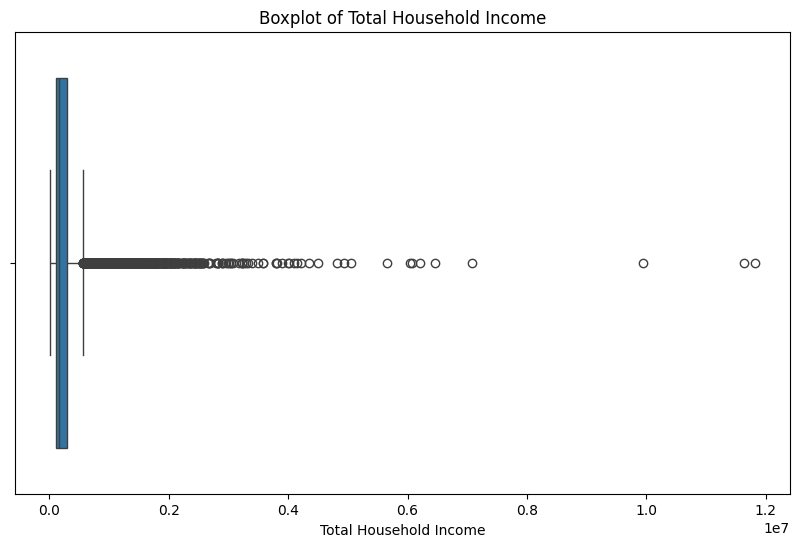

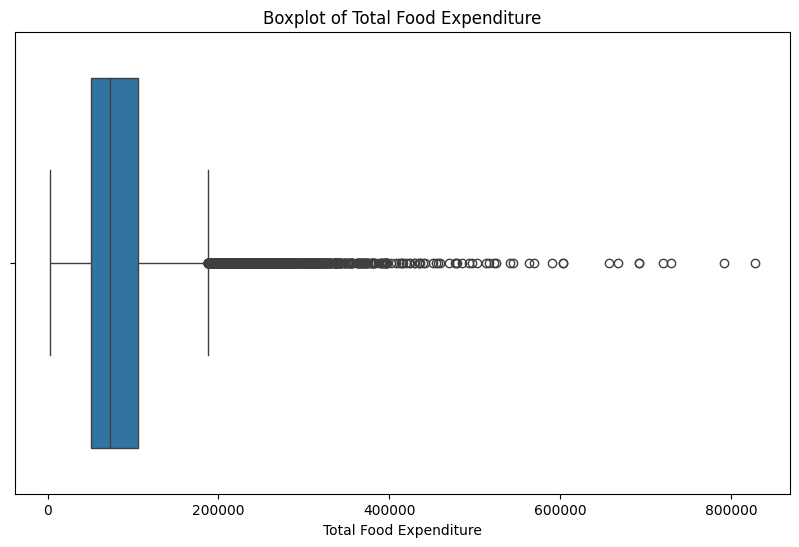

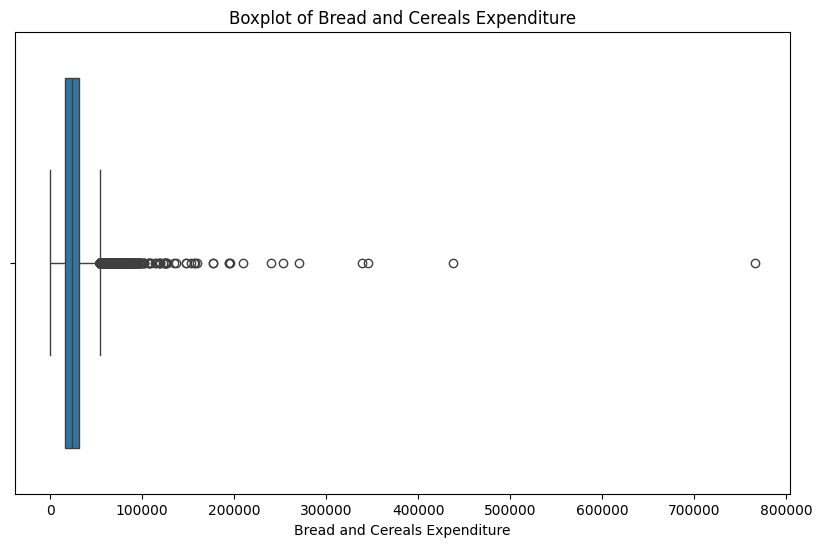

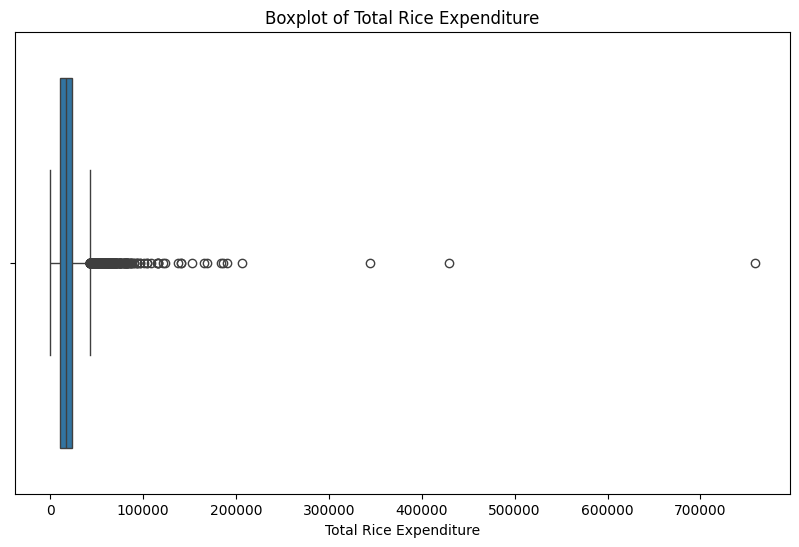

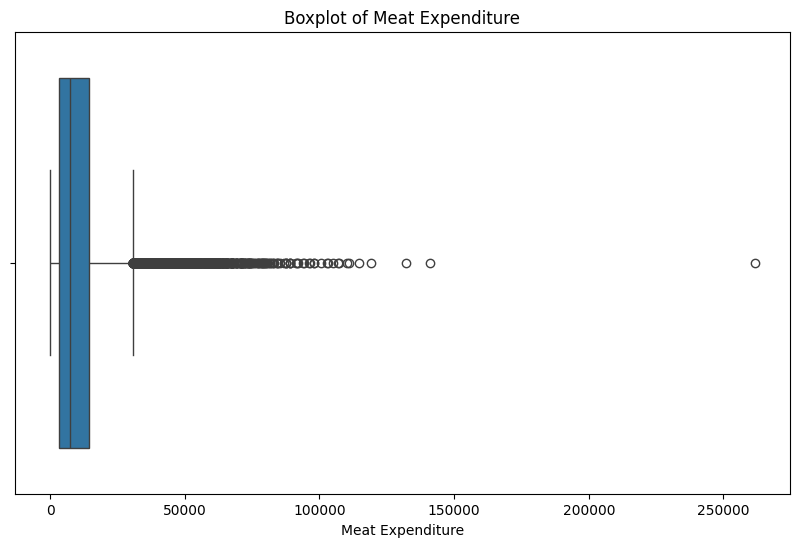

...

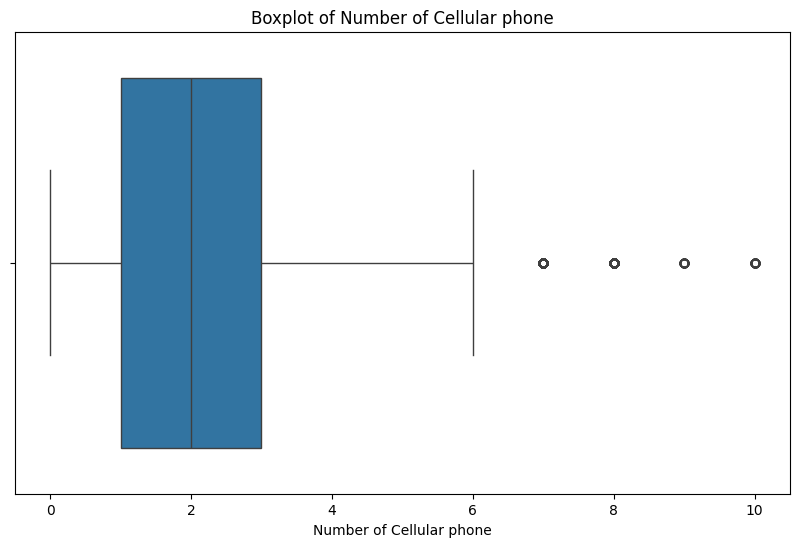

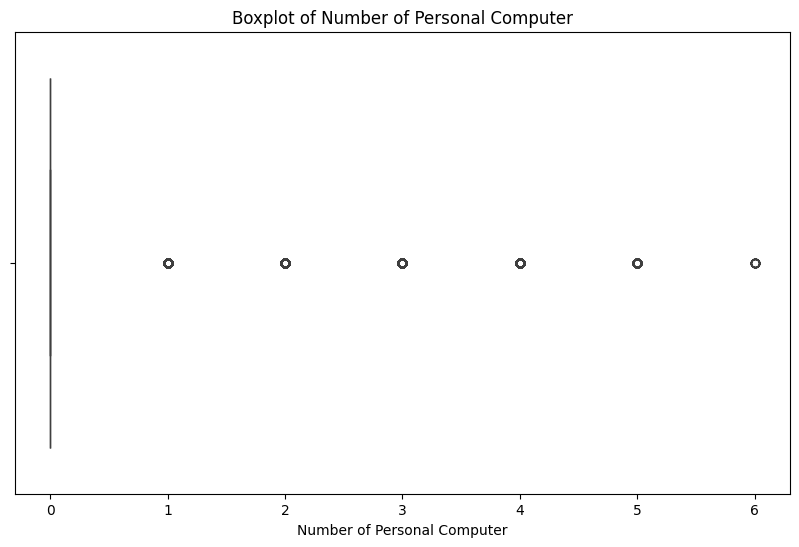

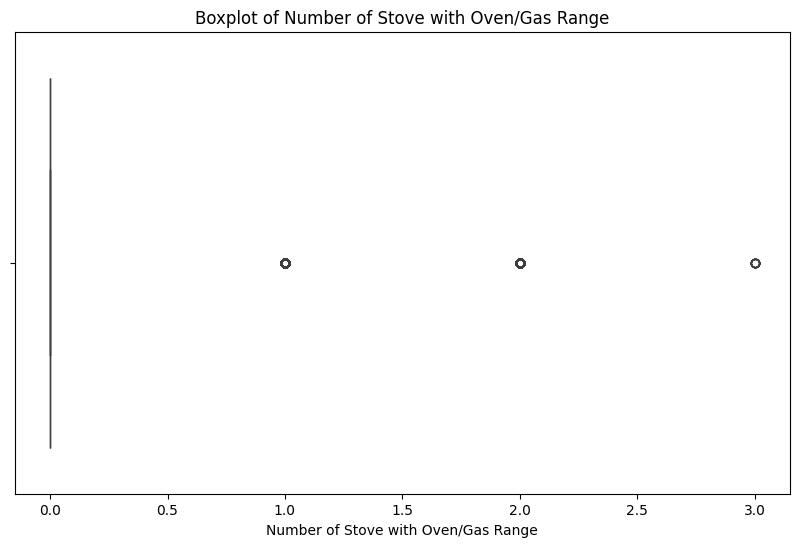

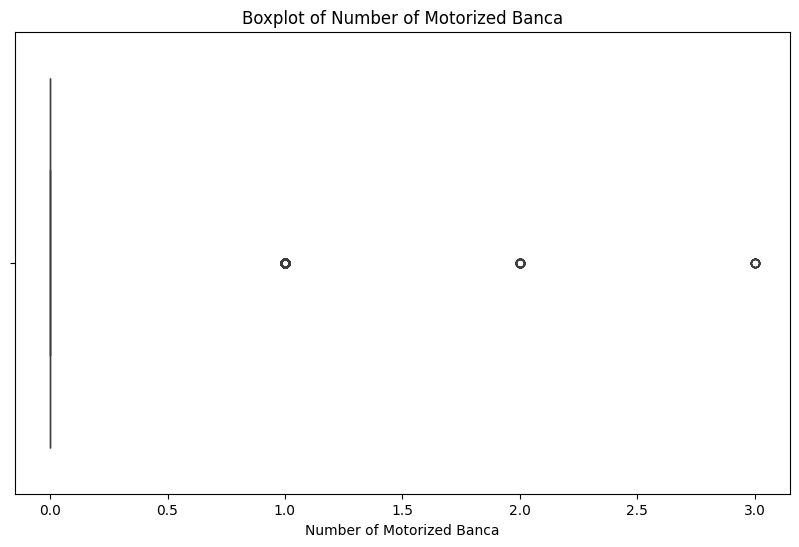

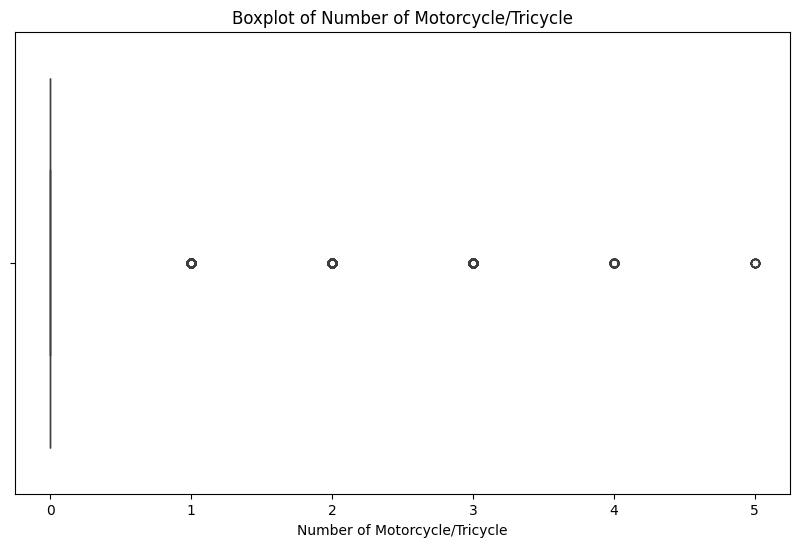

In [1006]:
# Boxplot for Numerical Columns
for col in numerical_columns:
    plt.figure(figsize=(10, 6))
    sns.boxplot(data=df, x=col)
    plt.title(f'Boxplot of {col}')
    plt.show()

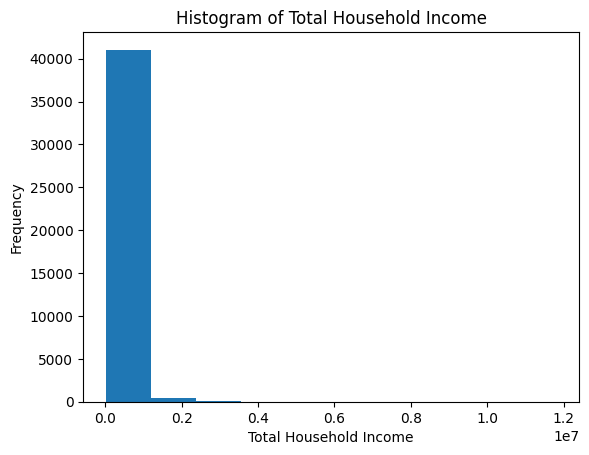

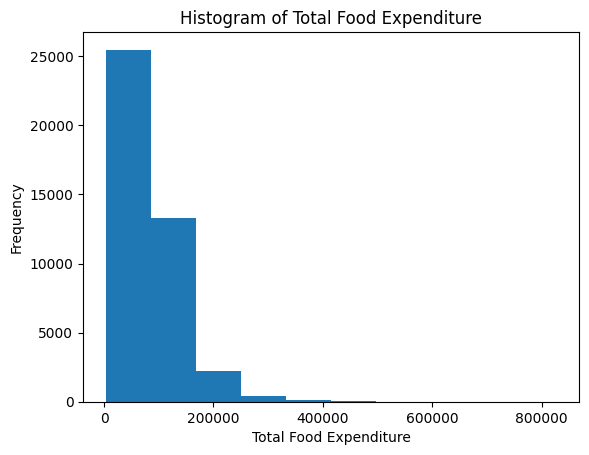

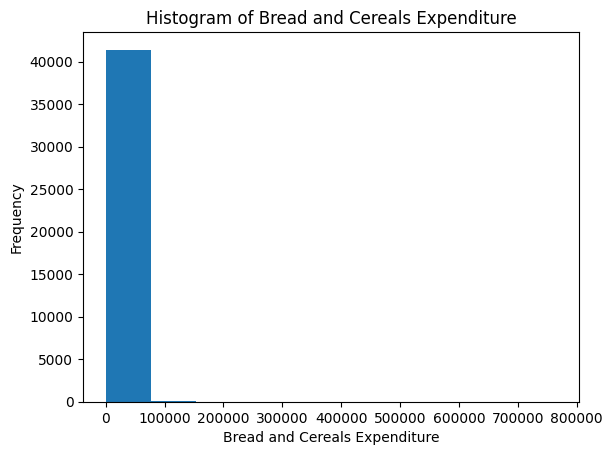

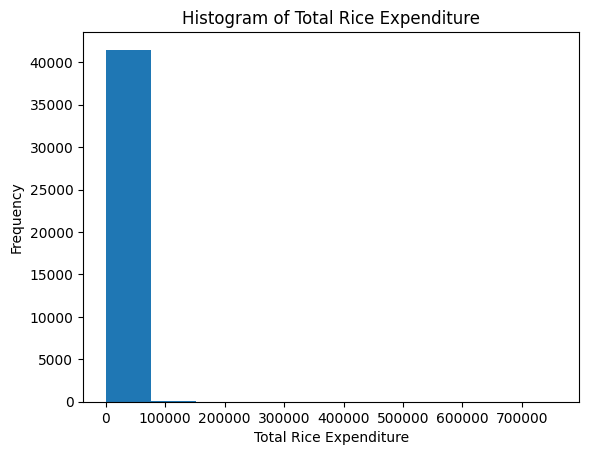

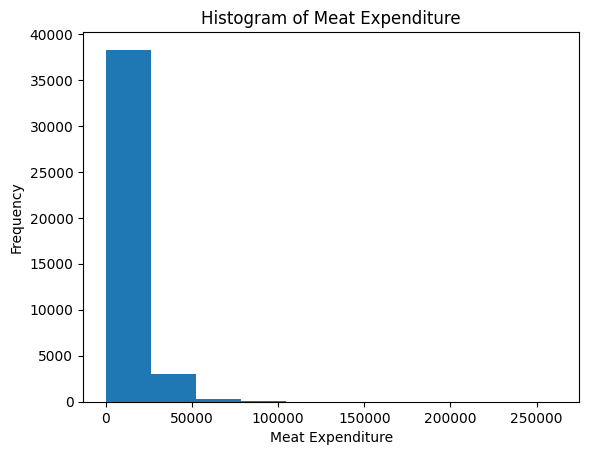

...

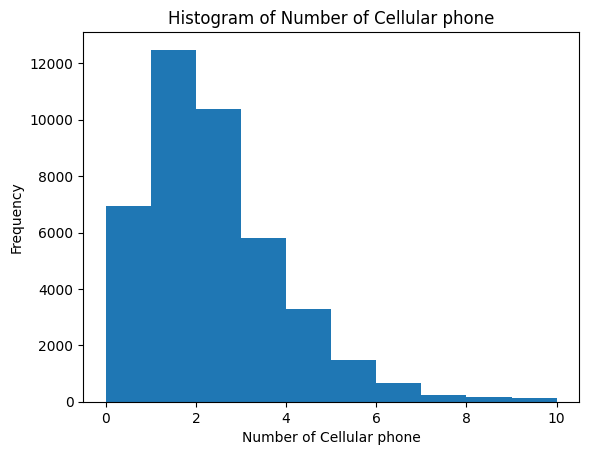

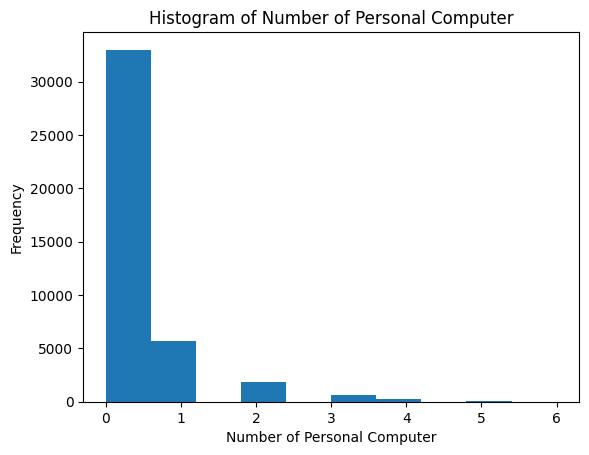

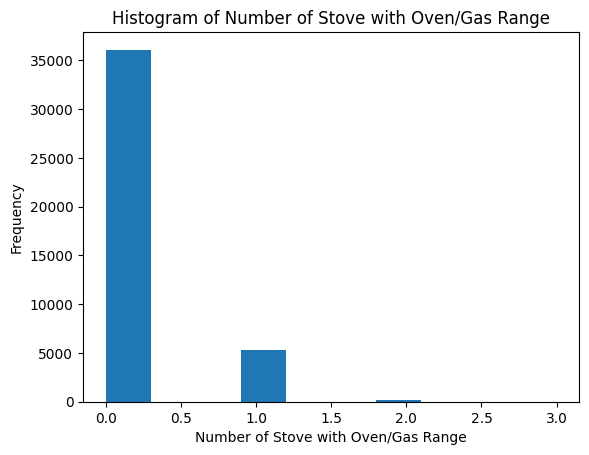

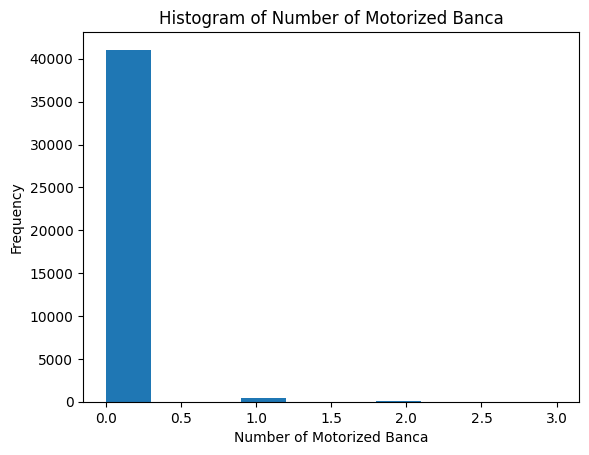

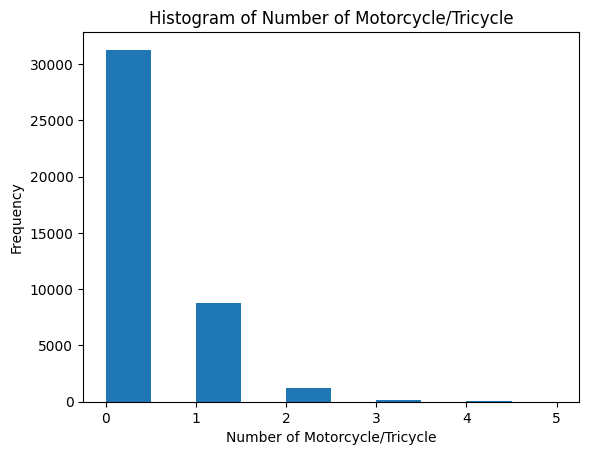

In [1007]:
# Histogram for all Numerical Columns, individually
for col in numerical_columns:
    plt.hist(df[col])
    plt.title(f'Histogram of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()

In [1008]:
# Average Total Household Income per Region
average_income_per_region = df.groupby('Region')['Total Household Income'].mean().sort_values(ascending=False)
average_income_per_region

,Total Household Income
Region,
NCR,420861.861501
IVA - CALABARZON,303360.536040
III - Central Luzon,292965.181650
CAR,269540.484638
XI - Davao Region,238115.891251
I - Ilocos Region,238110.084327
II - Cagayan Valley,236778.221721
VII - Central Visayas,234909.314050
VI - Western Visayas,220481.260260


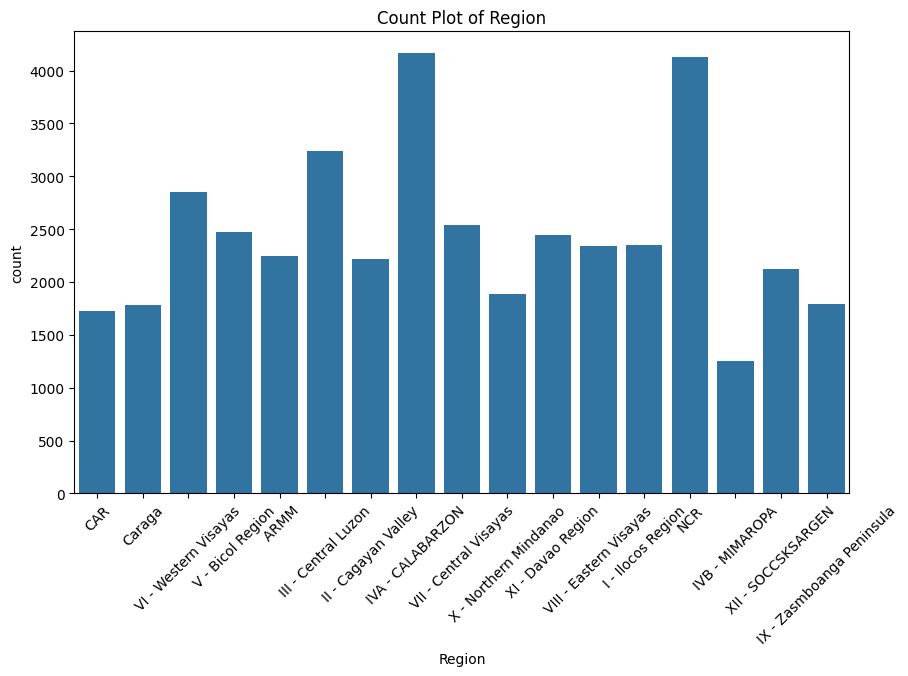

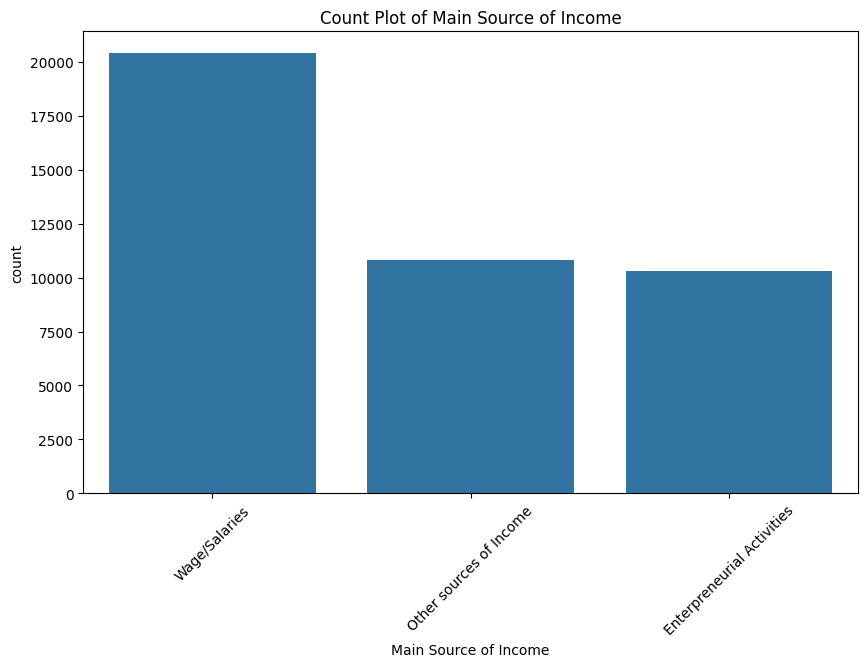

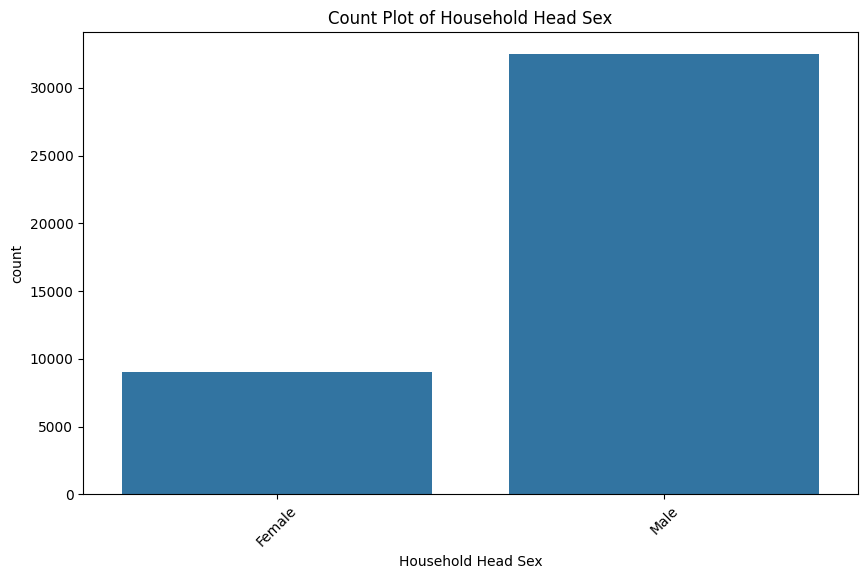

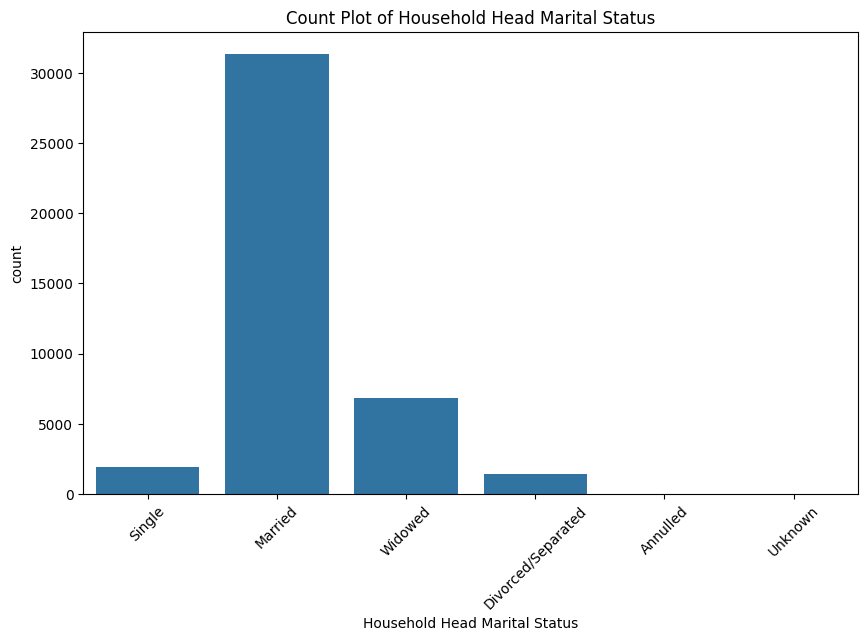

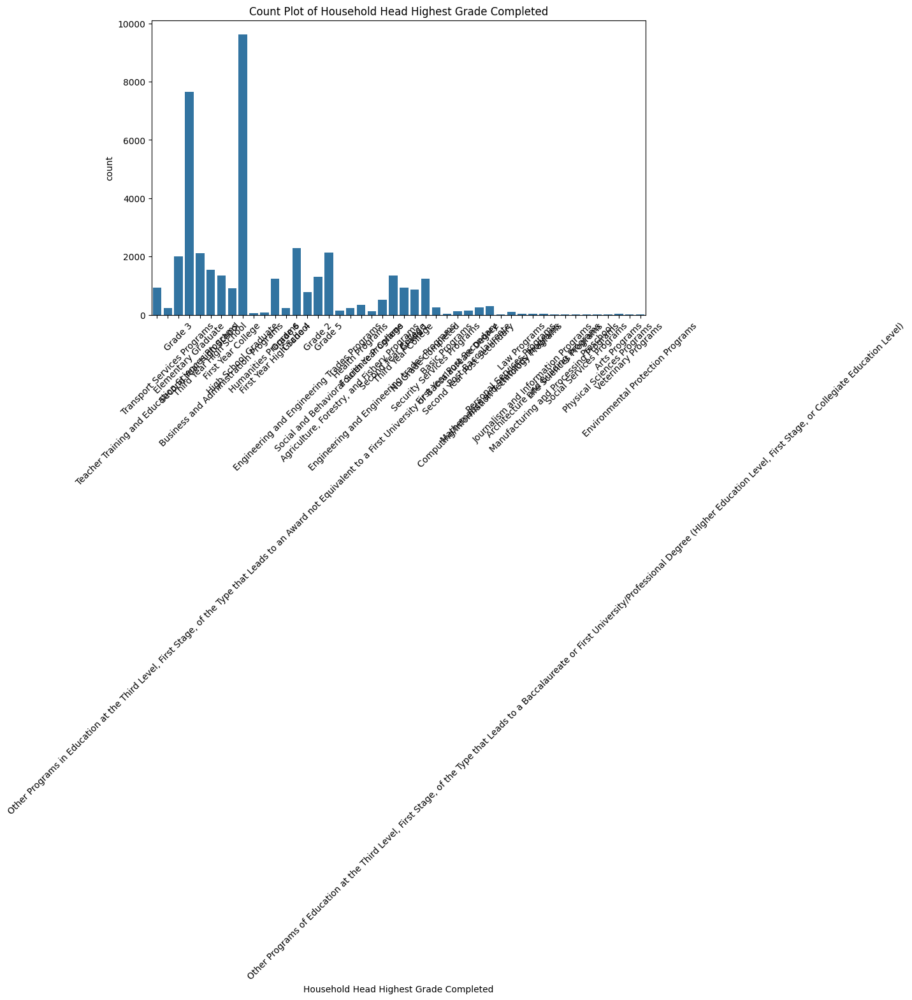

...

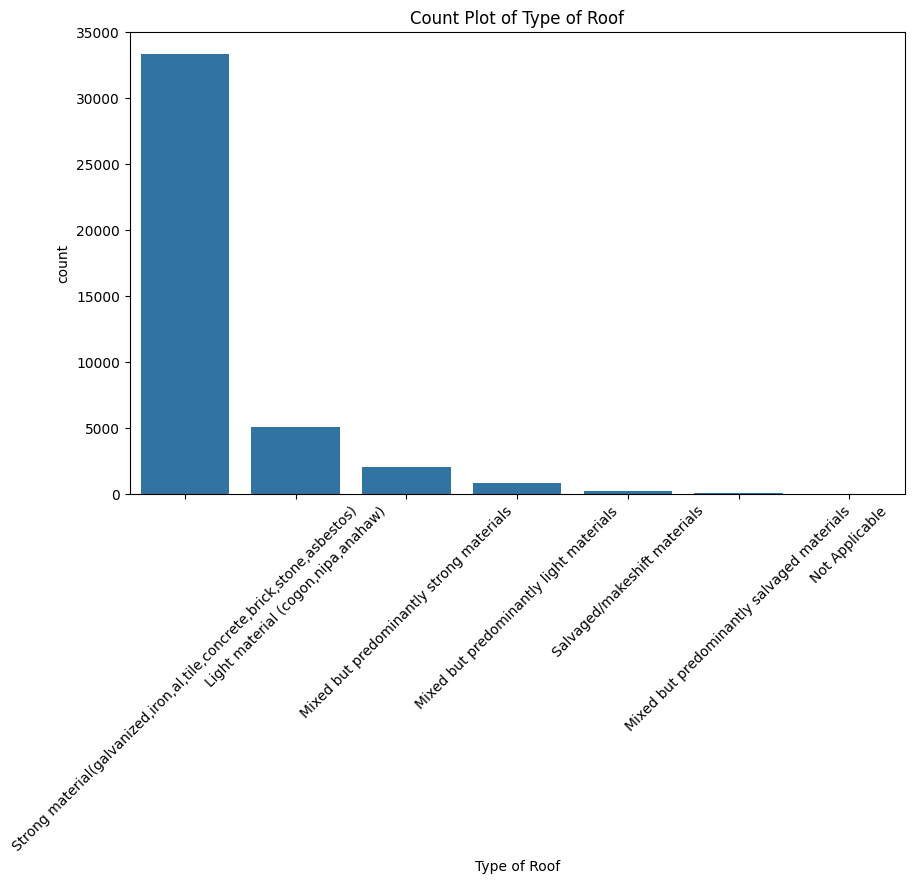

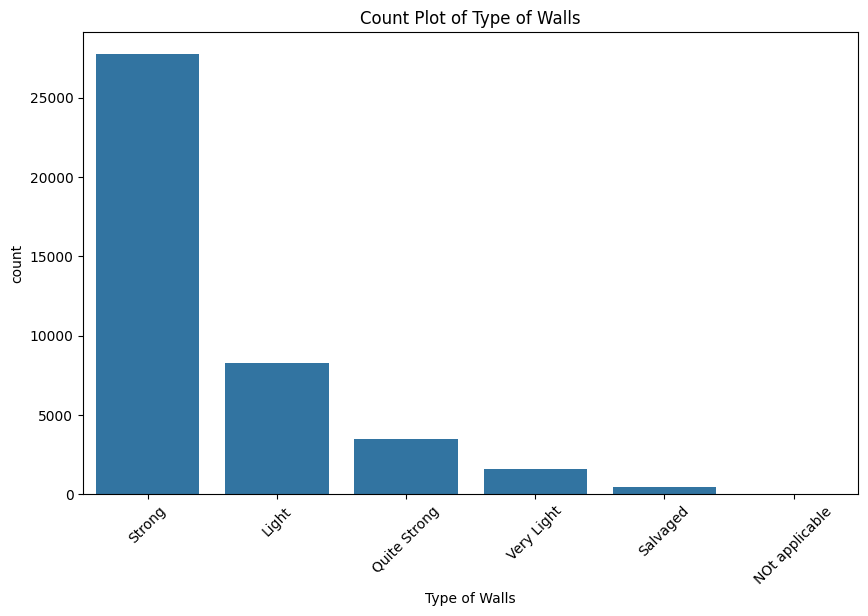

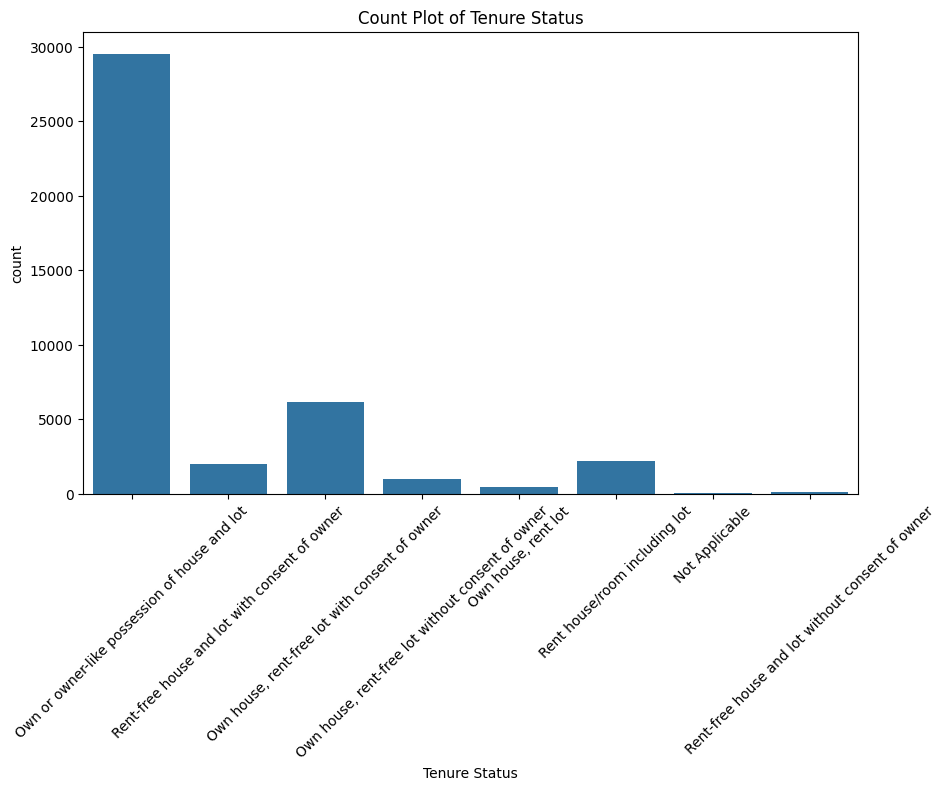

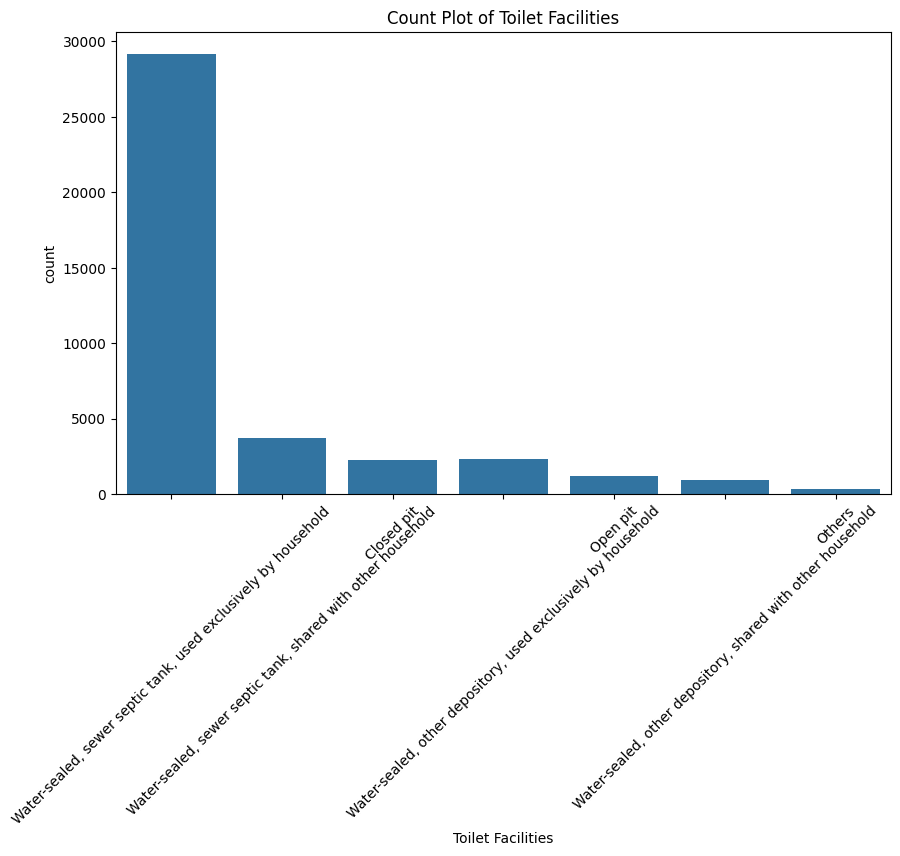

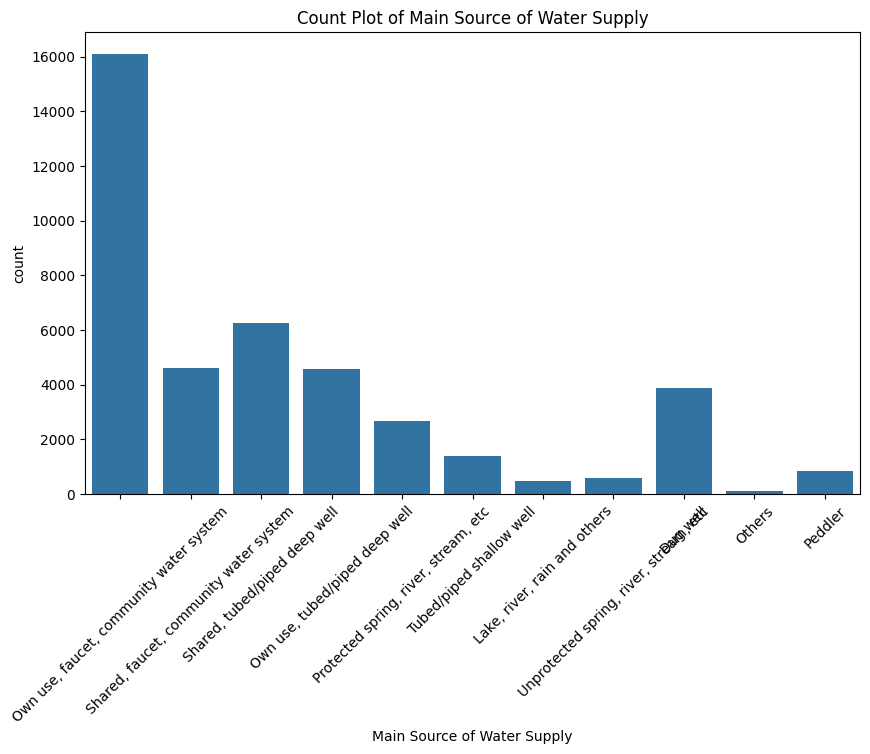

In [1009]:
# Plot categorical columns. Tilt x values
for col in categorical_columns:
    plt.figure(figsize=(10, 6))
    sns.countplot(data=df, x=col)
    plt.xticks(rotation=45)
    plt.title(f'Count Plot of {col}')

In [1010]:
# Unique Values of Null Columns : Household Head Occupation, Household Head Class of Worker, Toilet Facilities
null_columns = df.columns[df.isna().any()]
null_columns

Index(['Household Head Occupation', 'Household Head Class of Worker',
       'Toilet Facilities'],
      dtype='object')

In [1011]:
# Print unique values for each null column
for column in null_columns:
    unique_values = df[column].unique()
    print(f"Unique values for {column}: {unique_values}")

Unique values for Household Head Occupation: ['General elementary education teaching professionals'
 'Transport conductors' 'Farmhands and laborers' 'Rice farmers'
 'General managers/managing proprietors in transportation, storage and communications'
 'Heavy truck and lorry drivers' nan 'Hog raising farmers'
 'Vegetable farmers'
 'General managers/managing proprietors in wholesale and retail trade'
 'Stocks clerks' 'Justices' 'Other social science professionals'
 'Protective services workers n. e. c.' 'Secretaries'
 'Electronics mechanics and servicers' 'Foresters and related scientists'
 'Shop salespersons and demonstrators'
 'College, university and higher education teaching professionals'
 'General managers/managing proprietors of restaurants and hotels'
 'Welders and flamecutters' 'Car, taxi and van drivers'
 'Motor vehicle mechanics and related trades workers'
 'Traditional chiefs and heads of villages' 'Motorcycle drivers'
 'Statistical, mathematical and related associate profess

In [1012]:
df['Household Head Occupation'].value_counts()

,count
Household Head Occupation,
Farmhands and laborers,3478
Rice farmers,2849
General managers/managing proprietors in wholesale and retail trade,2028
"General managers/managing proprietors in transportation, storage and communications",1932
Corn farmers,1724
...,...
Petroleum and natural gas refining plant operators,1
Builders (traditional materials),1
"Personal care and related workers, n. e. c.",1


In [1013]:
df['Household Head Highest Grade Completed'].value_counts()

,count
Household Head Highest Grade Completed,
High School Graduate,9628
Elementary Graduate,7640
Grade 4,2282
Grade 5,2123
Second Year High School,2104
Grade 3,1994
Third Year High School,1545
Business and Administration Programs,1344
Second Year College,1343


In [1014]:
df['Household Head Class of Worker'].value_counts()

,count
Household Head Class of Worker,
Self-employed wihout any employee,13766
Worked for private establishment,13731
Worked for government/government corporation,2820
Employer in own family-operated farm or business,2581
Worked for private household,811
Worked without pay in own family-operated farm or business,285
Worked with pay in own family-operated farm or business,14


In [1015]:
# Regions of Rows with Null Columns
df[df['Household Head Occupation'].isna()]['Region'].value_counts() # 7536 Null Values

,count
Region,
NCR,1021
IVA - CALABARZON,924
III - Central Luzon,804
I - Ilocos Region,553
VI - Western Visayas,548
VII - Central Visayas,449
V - Bicol Region,411
VIII - Eastern Visayas,370
XI - Davao Region,366


In [1016]:
df[df['Household Head Class of Worker'].isna()]['Region'].value_counts() #7536 Null Values

,count
Region,
NCR,1021
IVA - CALABARZON,924
III - Central Luzon,804
I - Ilocos Region,553
VI - Western Visayas,548
VII - Central Visayas,449
V - Bicol Region,411
VIII - Eastern Visayas,370
XI - Davao Region,366


In [1017]:
# Regions of Rows with Null 'Household Head Occupation' and 'Household Head Class of Worker'
df[(df['Household Head Occupation'].isna()) & (df['Household Head Class of Worker'].isna())]['Region'].value_counts() # 7536 Null Values

,count
Region,
NCR,1021
IVA - CALABARZON,924
III - Central Luzon,804
I - Ilocos Region,553
VI - Western Visayas,548
VII - Central Visayas,449
V - Bicol Region,411
VIII - Eastern Visayas,370
XI - Davao Region,366


In [1018]:
df[df['Toilet Facilities'].isna()]['Region'].value_counts() # 1580 Null Values

,count
Region,
V - Bicol Region,277
VI - Western Visayas,224
VIII - Eastern Visayas,210
VII - Central Visayas,193
ARMM,144
IVA - CALABARZON,112
XII - SOCCSKSARGEN,86
IVB - MIMAROPA,76
Caraga,74


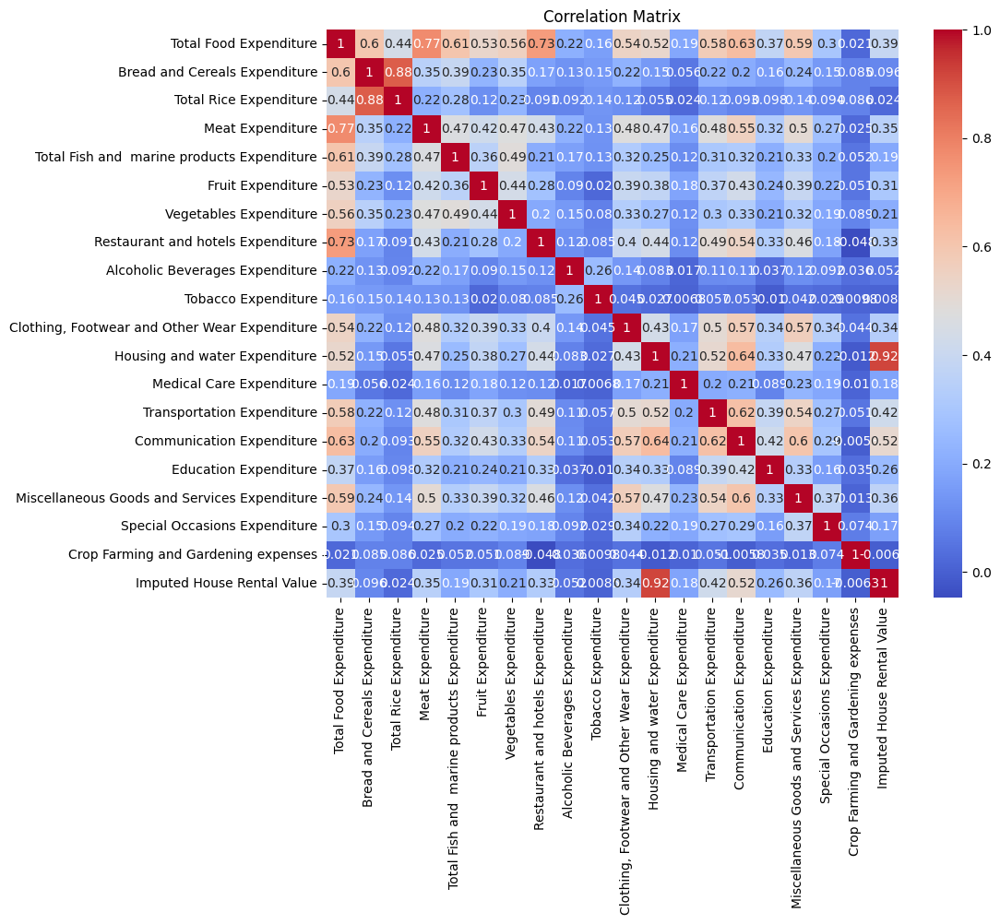

In [1019]:
# Plot Correlation Matrix for Numerical Values
plt.figure(figsize=(10, 8))
sns.heatmap(df[expenditure_columns].corr(), annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

# Feature Engineering

In [1020]:
# Get Unaccounted Bread and Cereals Expenditure by Subtracting Total Rice Expenditure from Bread and Cereals Expenditure
df['Other Bread and Cereals Expenditure'] = df['Bread and Cereals Expenditure'] - df['Total Rice Expenditure']

In [1021]:
# Include Other Bread and Cereals Expenditure
expenditure_columns = np.append(expenditure_columns, 'Other Bread and Cereals Expenditure')

In [1022]:
expenditure_columns

array(['Total Food Expenditure', 'Bread and Cereals Expenditure',
       'Total Rice Expenditure', 'Meat Expenditure',
       'Total Fish and  marine products Expenditure', 'Fruit Expenditure',
       'Vegetables Expenditure', 'Restaurant and hotels Expenditure',
       'Alcoholic Beverages Expenditure', 'Tobacco Expenditure',
       'Clothing, Footwear and Other Wear Expenditure',
       'Housing and water Expenditure', 'Medical Care Expenditure',
       'Transportation Expenditure', 'Communication Expenditure',
       'Education Expenditure',
       'Miscellaneous Goods and Services Expenditure',
       'Special Occasions Expenditure',
       'Crop Farming and Gardening expenses',
       'Imputed House Rental Value',
       'Other Bread and Cereals Expenditure'], dtype=object)

In [1023]:
# Aggregate Essential Spending
essential_cols = ['Total Food Expenditure', 'Housing and water Expenditure',
                  'Medical Care Expenditure', 'Education Expenditure',
                  'Communication Expenditure', 'Transportation Expenditure']

df['Total_Essential_Spending'] = df[essential_cols].sum(axis=1)

In [1024]:
# Aggregate Non-Essential Spending
non_essential_cols = [
    'Restaurant and hotels Expenditure', 'Alcoholic Beverages Expenditure',
    'Tobacco Expenditure', 'Clothing, Footwear and Other Wear Expenditure',
    'Miscellaneous Goods and Services Expenditure', 'Special Occasions Expenditure', 'Crop Farming and Gardening expenses'
]

df['Total_NonEssential_Spending'] = df[non_essential_cols].sum(axis=1)

In [1025]:
df['Total Expenditure'] = df['Total_Essential_Spending'] + df['Total_NonEssential_Spending']

In [1026]:
# Aggregate Non-Food Spending
non_food_expenditure_cols = ['Housing and water Expenditure', 'Alcoholic Beverages Expenditure',
                             'Tobacco Expenditure', 'Clothing, Footwear and Other Wear Expenditure',
                             'Miscellaneous Goods and Services Expenditure', 'Special Occasions Expenditure',
                             'Restaurant and hotels Expenditure', 'Crop Farming and Gardening expenses',
                             'Medical Care Expenditure', 'Education Expenditure',
                             'Communication Expenditure', 'Transportation Expenditure']

df['Total_NonFood_Spending'] = df[non_food_expenditure_cols].sum(axis=1)

In [1027]:
specific_food_expenditure_cols = ['Bread and Cereals Expenditure', 'Other Bread and Cereals Expenditure', 'Total Rice Expenditure', 'Meat Expenditure',
                                  'Total Fish and  marine products Expenditure', 'Fruit Expenditure', 'Vegetables Expenditure']

In [1028]:
# Income minus Expenditure
df['Diff_Income_Expenditure'] = df['Total Household Income'] - df['Total Expenditure']

In [1029]:
# Check Difference is less than 0
df[df['Diff_Income_Expenditure'] < 0][['Total Household Income', 'Total Expenditure', 'Diff_Income_Expenditure']]

,Total Household Income,Total Expenditure,Diff_Income_Expenditure
2,82785,96213,-13428
3,107589,130679,-23090
6,198621,244520,-45899
7,134961,208282,-73321
10,147005,195427,-48422
...,...,...,...
41538,130636,149483,-18847
41539,119773,170246,-50473
41540,137320,153751,-16431
41542,129500,223485,-93985


In [1030]:
# Add Essential and Non-Essential Spending to expenditure columns
expenditure_columns = np.append(expenditure_columns, 'Total_Essential_Spending')
expenditure_columns = np.append(expenditure_columns, 'Total_NonEssential_Spending')
expenditure_columns = np.append(expenditure_columns, 'Total_NonFood_Spending')
expenditure_columns

array(['Total Food Expenditure', 'Bread and Cereals Expenditure',
       'Total Rice Expenditure', 'Meat Expenditure',
       'Total Fish and  marine products Expenditure', 'Fruit Expenditure',
       'Vegetables Expenditure', 'Restaurant and hotels Expenditure',
       'Alcoholic Beverages Expenditure', 'Tobacco Expenditure',
       'Clothing, Footwear and Other Wear Expenditure',
       'Housing and water Expenditure', 'Medical Care Expenditure',
       'Transportation Expenditure', 'Communication Expenditure',
       'Education Expenditure',
       'Miscellaneous Goods and Services Expenditure',
       'Special Occasions Expenditure',
       'Crop Farming and Gardening expenses',
       'Imputed House Rental Value',
       'Other Bread and Cereals Expenditure', 'Total_Essential_Spending',
       'Total_NonEssential_Spending', 'Total_NonFood_Spending'],
      dtype=object)

In [1031]:
food_ratio_columns = []

In [1032]:
# Create ratios for each food column
for col in specific_food_expenditure_cols:
    df[col + ' Ratio'] = df[col] / df['Total Food Expenditure']
    food_ratio_columns = np.append(food_ratio_columns, col + ' Ratio')

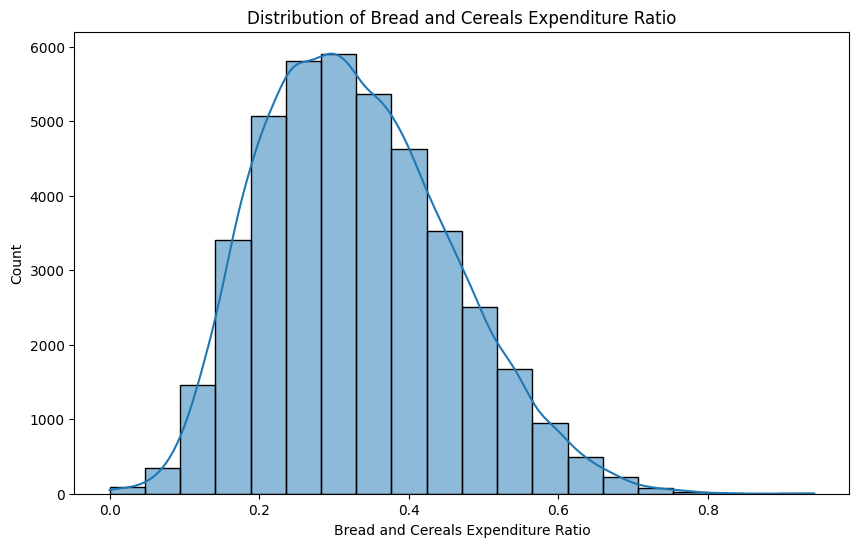

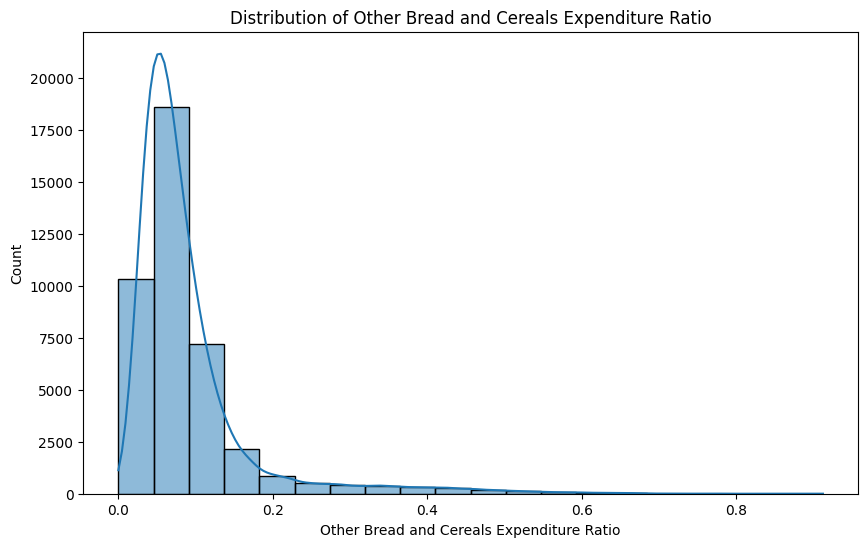

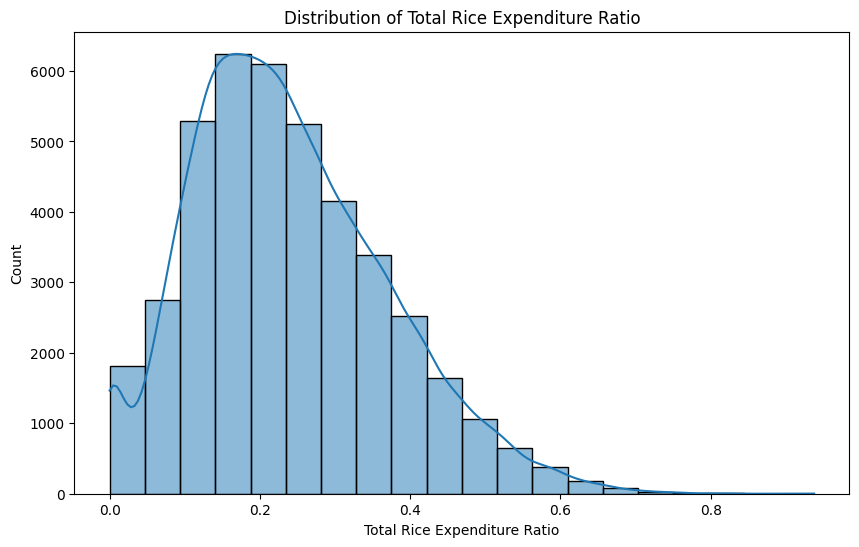

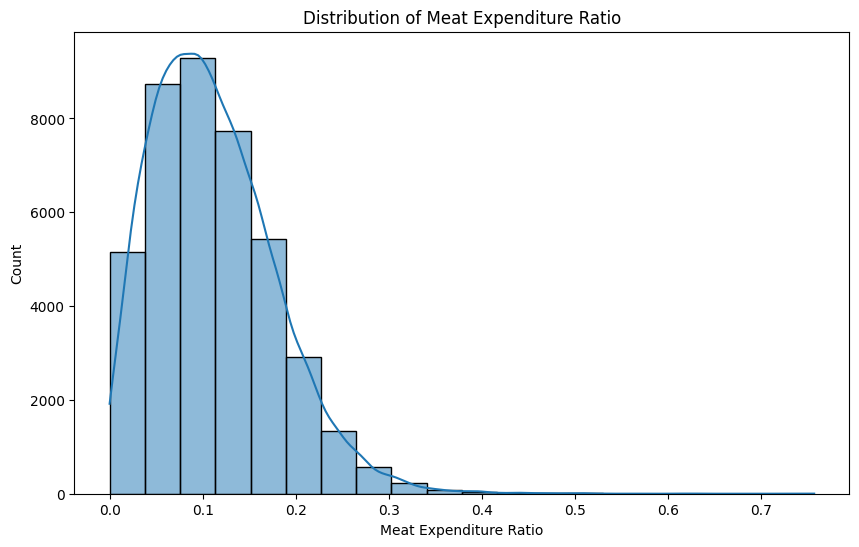

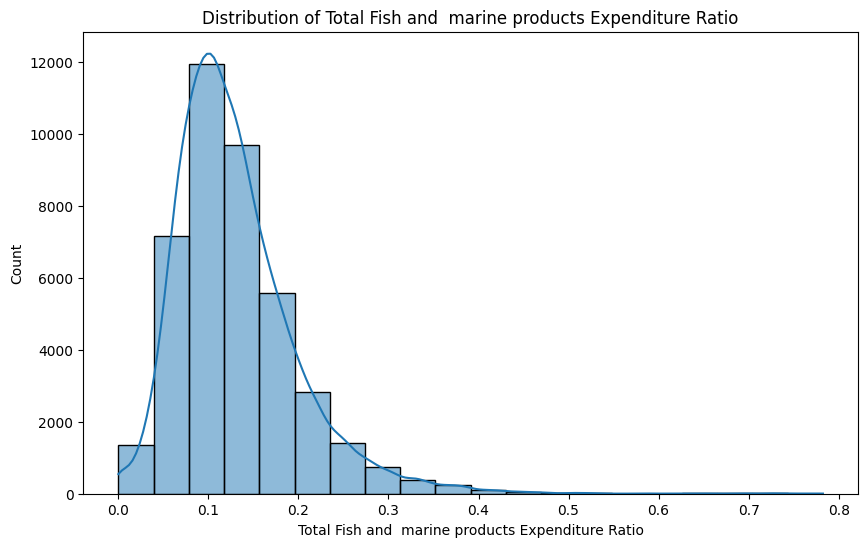

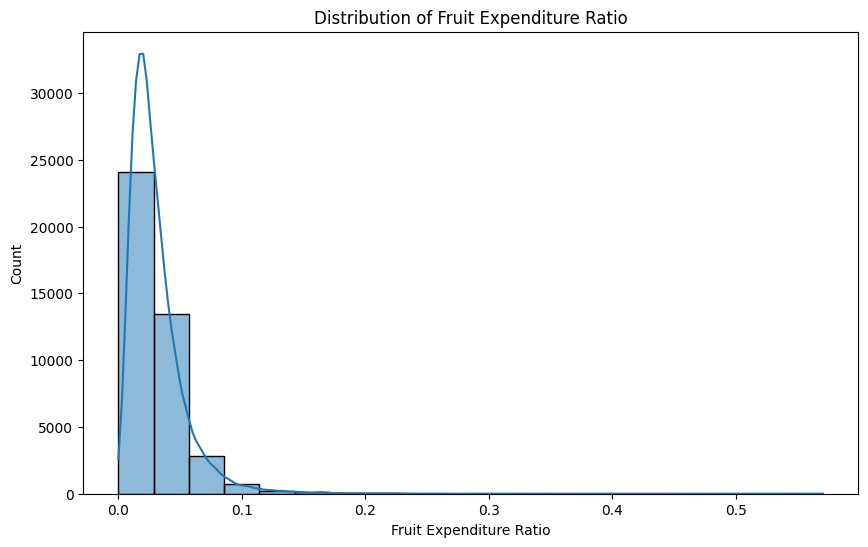

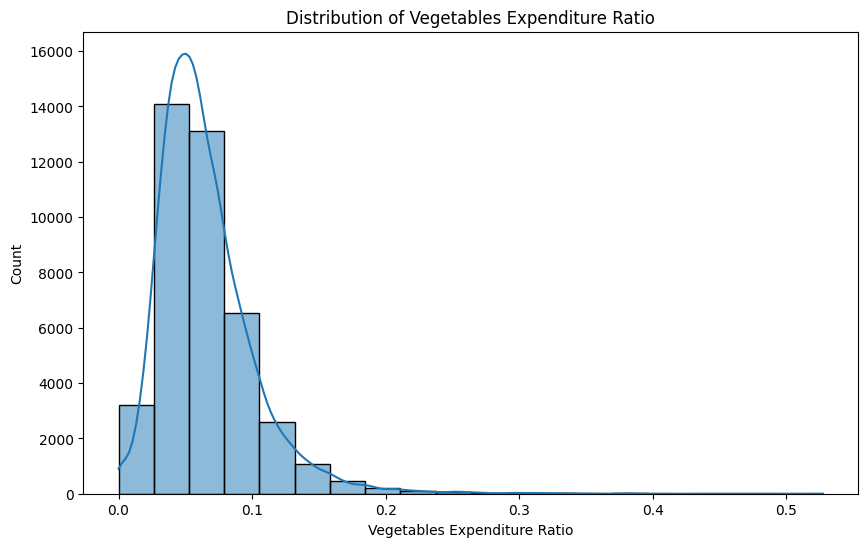

In [1033]:
# Plot Food Ratios
for col in food_ratio_columns:
    plt.figure(figsize=(10, 6))
    sns.histplot(df[col], bins=20, kde=True)
    plt.title(f'Distribution of {col}')

In [1034]:
# Add Newly Created Expenditure Columns to Expenditure cols
expenditure_columns = np.append(expenditure_columns, 'Total_Essential_Spending')
expenditure_columns = np.append(expenditure_columns, 'Total_NonEssential_Spending')
expenditure_columns = np.append(expenditure_columns, 'Total_NonFood_Spending')
expenditure_columns = np.append(expenditure_columns, 'Total Expenditure')

In [1035]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41544 entries, 0 to 41543
Data columns (total 73 columns):
 #   Column                                             Non-Null Count  Dtype  
---  ------                                             --------------  -----  
 0   Total Household Income                             41544 non-null  int64  
 1   Region                                             41544 non-null  object 
 2   Total Food Expenditure                             41544 non-null  int64  
 3   Main Source of Income                              41544 non-null  object 
 4   Agricultural Household indicator                   41544 non-null  int64  
 5   Bread and Cereals Expenditure                      41544 non-null  int64  
 6   Total Rice Expenditure                             41544 non-null  int64  
 7   Meat Expenditure                                   41544 non-null  int64  
 8   Total Fish and  marine products Expenditure        41544 non-null  int64  
 9   Fruit 

In [ ]:
# Check

In [1036]:
# Categorize Household, Electronic Appliances, and Vehicle Counts
household_appliances = ['Number of Refrigerator/Freezer',
                        'Number of Airconditioner',
                'Number of Stove with Oven/Gas Range',
                'Number of Washing Machine']

electronic_appliances = ['Number of Television', 'Number of CD/VCD/DVD',
                 'Number of Landline/wireless telephones', 'Number of Cellular phone',
                 'Number of Personal Computer', 'Number of Component/Stereo set']

vehicles_counts = ['Number of Car, Jeep, Van', 'Number of Motorcycle/Tricycle', 'Number of Motorized Banca']

In [1037]:
# Create Household and Electronic Appliances and Vehicle Counts
df['Household_Appliances'] = df[household_appliances].sum(axis=1)
df['Electronic_Appliances'] = df[electronic_appliances].sum(axis=1)
df['Vehicles_Count'] = df[vehicles_counts].sum(axis=1)

In [1038]:
# Drop all columns in household_appliances, electronic_appliances, and vehicles_counts from Numerical columns
for col in household_appliances:
    if col in numerical_columns:
        numerical_columns = np.delete(numerical_columns, np.where(numerical_columns == col))

for col in electronic_appliances:
    if col in numerical_columns:
        numerical_columns = np.delete(numerical_columns, np.where(numerical_columns == col))

for col in vehicles_counts:
    if col in numerical_columns:
        numerical_columns = np.delete(numerical_columns, np.where(numerical_columns == col))

Text(0, 0.5, 'Frequency')

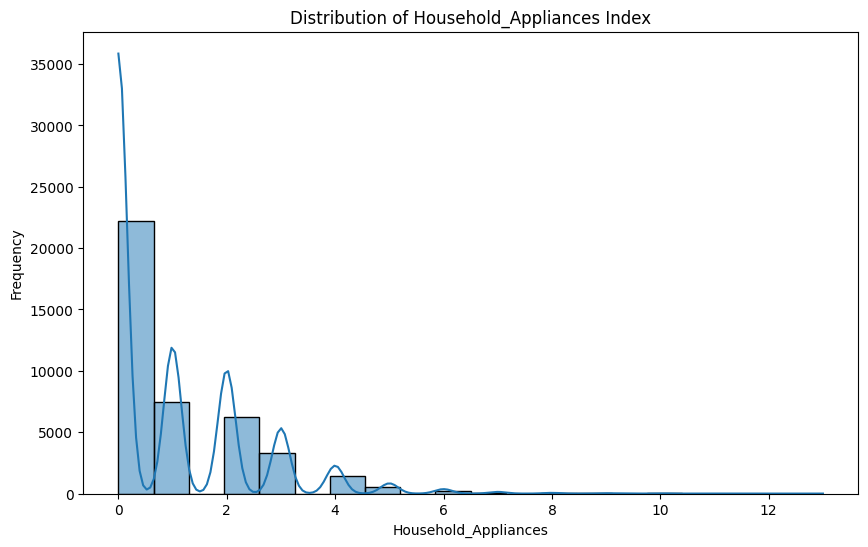

In [1039]:
# Plot Household Appliances Index
plt.figure(figsize=(10, 6))
sns.histplot(df['Household_Appliances'], bins=20, kde=True)
plt.title('Distribution of Household_Appliances Index')
plt.xlabel('Household_Appliances')
plt.ylabel('Frequency')

Text(0, 0.5, 'Frequency')

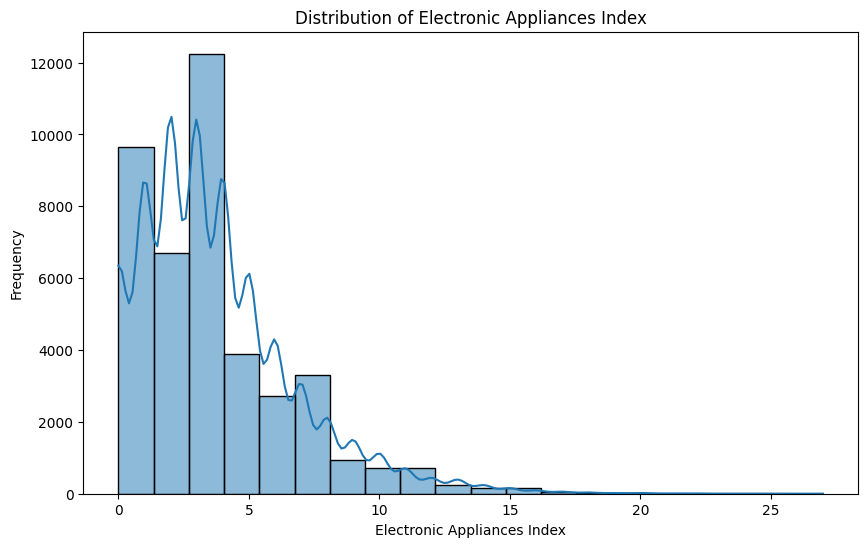

In [1040]:
# Plot Electronic Appliances Assets
plt.figure(figsize=(10, 6))
sns.histplot(df['Electronic_Appliances'], bins=20, kde=True)
plt.title('Distribution of Electronic Appliances Index')
plt.xlabel('Electronic Appliances Index')
plt.ylabel('Frequency')

Text(0, 0.5, 'Frequency')

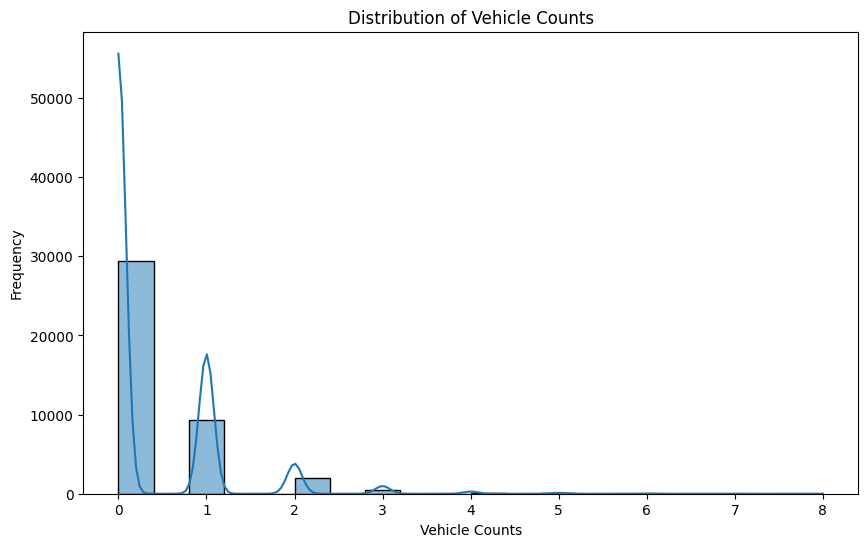

In [1041]:
# Plot Vehicle Counts
plt.figure(figsize=(10, 6))
sns.histplot(df['Vehicles_Count'], bins=20, kde=True)
plt.title('Distribution of Vehicle Counts')
plt.xlabel('Vehicle Counts')
plt.ylabel('Frequency')

In [1042]:
# Duplicate dataset
df_copy = df.copy()

In [1043]:
# import counter
from collections import Counter

def IQR_method(df, n, features):
    """
    Takes a dataframe and returns an index list corresponding to the observations
    containing more than n outliers according to the Tukey IQR method.
    """
    outlier_list = []

    for column in features:  # Iterate over numerical columns only

        # 1st quartile (25%)
        Q1 = np.percentile(df[column], 25)
        # 3rd quartile (75%)
        Q3 = np.percentile(df[column], 75)

        # Interquartile range (IQR)
        IQR = Q3 - Q1

        # outlier step
        outlier_step = 1.5 * IQR

        # Determining a list of indices of outliers
        outlier_list_column = df[(df[column] < Q1 - outlier_step) | (df[column] > Q3 + outlier_step)].index

        # appending the list of outliers
        outlier_list.extend(outlier_list_column)

    # selecting observations containing more than x outliers
    outlier_list = Counter(outlier_list)
    multiple_outliers = list(k for k, v in outlier_list.items() if v > n)

    # Calculate the number of records below and above lower and above bound value respectively
    df1 = df[df[column] < Q1 - outlier_step]
    df2 = df[df[column] > Q3 + outlier_step]

    print('Total number of outliers is:', df1.shape[0] + df2.shape[0])

    return multiple_outliers

In [1044]:
# Add Food Columns, Non-Food Columns, and aggregate columns into outlier detection columns
# aggregate_columns = ['Total Household Income', 'Total Food Expenditure', 'Total_Essential_Spending', 'Total_NonEssential_Spending', 'Total_NonFood_Spending', 'Total Expenditure']
aggregate_columns = ['Total Household Income']

In [1045]:
# outlier_detection_columns = np.append(specific_food_expenditure_cols, aggregate_columns)
outlier_detection_columns = np.append(specific_food_expenditure_cols, non_food_expenditure_cols)
outlier_detection_columns = np.append(outlier_detection_columns, aggregate_columns)

In [1046]:
Outliers_IQR = IQR_method(df_copy, 1, numerical_columns)

Total number of outliers is: 4536


In [1047]:
df_extracted_outliers = df_copy.loc[Outliers_IQR]

In [1048]:
# Original DF retaining non-outliers
df_non_outliers = df.loc[~df.index.isin(Outliers_IQR)]

In [1049]:
df_outliers = df[df.index.isin(Outliers_IQR)]

In [1050]:
df_outliers.info()

<class 'pandas.core.frame.DataFrame'>
Index: 17844 entries, 0 to 41532
Data columns (total 76 columns):
 #   Column                                             Non-Null Count  Dtype  
---  ------                                             --------------  -----  
 0   Total Household Income                             17844 non-null  int64  
 1   Region                                             17844 non-null  object 
 2   Total Food Expenditure                             17844 non-null  int64  
 3   Main Source of Income                              17844 non-null  object 
 4   Agricultural Household indicator                   17844 non-null  int64  
 5   Bread and Cereals Expenditure                      17844 non-null  int64  
 6   Total Rice Expenditure                             17844 non-null  int64  
 7   Meat Expenditure                                   17844 non-null  int64  
 8   Total Fish and  marine products Expenditure        17844 non-null  int64  
 9   Fruit Expen

In [1051]:
df_copy = df_copy.drop(Outliers_IQR, axis = 0).reset_index(drop=True)

In [1052]:
df_copy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23700 entries, 0 to 23699
Data columns (total 76 columns):
 #   Column                                             Non-Null Count  Dtype  
---  ------                                             --------------  -----  
 0   Total Household Income                             23700 non-null  int64  
 1   Region                                             23700 non-null  object 
 2   Total Food Expenditure                             23700 non-null  int64  
 3   Main Source of Income                              23700 non-null  object 
 4   Agricultural Household indicator                   23700 non-null  int64  
 5   Bread and Cereals Expenditure                      23700 non-null  int64  
 6   Total Rice Expenditure                             23700 non-null  int64  
 7   Meat Expenditure                                   23700 non-null  int64  
 8   Total Fish and  marine products Expenditure        23700 non-null  int64  
 9   Fruit 

In [1053]:
df_extracted_outliers.info()

<class 'pandas.core.frame.DataFrame'>
Index: 17844 entries, 9 to 40778
Data columns (total 76 columns):
 #   Column                                             Non-Null Count  Dtype  
---  ------                                             --------------  -----  
 0   Total Household Income                             17844 non-null  int64  
 1   Region                                             17844 non-null  object 
 2   Total Food Expenditure                             17844 non-null  int64  
 3   Main Source of Income                              17844 non-null  object 
 4   Agricultural Household indicator                   17844 non-null  int64  
 5   Bread and Cereals Expenditure                      17844 non-null  int64  
 6   Total Rice Expenditure                             17844 non-null  int64  
 7   Meat Expenditure                                   17844 non-null  int64  
 8   Total Fish and  marine products Expenditure        17844 non-null  int64  
 9   Fruit Expen

In [1054]:
df_copy.describe()

,Total Household Income,Total Food Expenditure,Agricultural Household indicator,Bread and Cereals Expenditure,Total Rice Expenditure,Meat Expenditure,Total Fish and marine products Expenditure,Fruit Expenditure,Vegetables Expenditure,Restaurant and hotels Expenditure,...,Bread and Cereals Expenditure Ratio,Other Bread and Cereals Expenditure Ratio,Total Rice Expenditure Ratio,Meat Expenditure Ratio,Total Fish and marine products Expenditure Ratio,Fruit Expenditure Ratio,Vegetables Expenditure Ratio,Household_Appliances,Electronic_Appliances,Vehicles_Count
count,23700.000000,23700.000000,23700.000000,23700.000000,23700.000000,23700.000000,23700.000000,23700.000000,23700.000000,23700.000000,...,23700.000000,23700.000000,23700.000000,23700.000000,23700.000000,23700.000000,23700.000000,23700.000000,23700.000000,23700.000000
mean,142418.385401,63705.446624,0.398059,21855.889916,16211.326667,6985.407046,8318.452152,1682.846835,4023.727637,8966.995316,...,0.359750,0.095267,0.264483,0.101875,0.133926,0.027831,0.067653,0.498608,2.676582,0.217511
std,77292.628778,27538.945273,0.641107,9632.470760,8977.536462,5893.028309,5134.624840,1312.336101,2261.800051,11123.892445,...,0.117401,0.089584,0.129251,0.061297,0.065066,0.019922,0.035783,0.842281,1.872784,0.463974
min,11285.000000,2947.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,88658.250000,43809.750000,0.000000,14889.750000,9949.500000,2628.000000,4738.000000,815.000000,2470.000000,1300.000000,...,0.274993,0.046374,0.175102,0.055663,0.089478,0.014876,0.043870,0.000000,1.000000,0.000000
50%,126000.500000,60432.000000,0.000000,20860.000000,15120.000000,5342.500000,7319.000000,1380.000000,3652.000000,4850.000000,...,0.352917,0.069278,0.254652,0.093182,0.123502,0.023208,0.061297,0.000000,2.000000,0.000000
75%,177510.000000,79867.500000,1.000000,27969.250000,21992.000000,9693.500000,10816.250000,2205.000000,5169.000000,12430.000000,...,0.437546,0.105664,0.348811,0.138739,0.166290,0.035622,0.084468,1.000000,4.000000,0.000000
max,889408.000000,186889.000000,2.000000,123158.000000,50688.000000,67704.000000,96436.000000,45720.000000,32940.000000,123390.000000,...,0.871279,0.871279,0.804760,0.505488,0.732279,0.477563,0.484110,6.000000,16.000000,5.000000


In [1055]:
df_extracted_outliers.describe()

,Total Household Income,Total Food Expenditure,Agricultural Household indicator,Bread and Cereals Expenditure,Total Rice Expenditure,Meat Expenditure,Total Fish and marine products Expenditure,Fruit Expenditure,Vegetables Expenditure,Restaurant and hotels Expenditure,...,Bread and Cereals Expenditure Ratio,Other Bread and Cereals Expenditure Ratio,Total Rice Expenditure Ratio,Meat Expenditure Ratio,Total Fish and marine products Expenditure Ratio,Fruit Expenditure Ratio,Vegetables Expenditure Ratio,Household_Appliances,Electronic_Appliances,Vehicles_Count
count,1.784400e+04,17844.000000,17844.000000,17844.000000,17844.000000,17844.000000,17844.000000,17844.000000,17844.000000,17844.000000,...,17844.000000,17844.000000,17844.000000,17844.000000,17844.000000,17844.000000,17844.000000,17844.000000,17844.000000,17844.000000
mean,3.871965e+05,113513.805369,0.472091,29487.268774,20831.591123,15261.299484,13465.741145,3702.839218,6312.770679,24029.304640,...,0.291512,0.083140,0.208372,0.125038,0.126218,0.034063,0.062387,1.616678,5.142177,0.605638
std,3.866502e+05,61526.989251,0.719038,16302.090793,14176.503058,13091.174103,9589.674264,3989.800661,3946.306283,31851.896696,...,0.127184,0.072689,0.125157,0.071309,0.071974,0.026571,0.037728,1.608071,3.537141,0.893658
min,1.623800e+04,3704.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.695645e+05,70652.250000,0.000000,19652.750000,12640.000000,5553.500000,7140.000000,1603.000000,3730.000000,3840.000000,...,0.196978,0.044886,0.119939,0.072078,0.079143,0.017515,0.038509,0.000000,3.000000,0.000000
50%,2.996870e+05,102796.000000,0.000000,27064.500000,18722.000000,12223.500000,11300.000000,2715.000000,5503.500000,13655.000000,...,0.268024,0.065538,0.181321,0.119069,0.111786,0.027556,0.054762,1.000000,5.000000,0.000000
75%,4.798470e+05,142665.750000,1.000000,36215.750000,26473.000000,21470.000000,17100.500000,4600.000000,7887.250000,33380.000000,...,0.366685,0.095054,0.272350,0.168606,0.155720,0.042463,0.076807,3.000000,7.000000,1.000000
max,1.181599e+07,827565.000000,2.000000,765864.000000,758326.000000,261566.000000,188208.000000,273769.000000,74800.000000,725296.000000,...,0.942536,0.912052,0.937802,0.756644,0.782541,0.570670,0.527558,13.000000,27.000000,8.000000


In [ ]:
# Create Modified expenditure columns
'''modified_expenditure_columns = ['Total Food Expenditure', 'Restaurant and hotels Expenditure',
                                'Housing and water Expenditure', 'Alcoholic Beverages Expenditure',
                                'Tobacco Expenditure', 'Clothing, Footwear and Other Wear Expenditure',
                                'Miscellaneous Goods and Services Expenditure', 'Special Occasions Expenditure', 'Medical Care Expenditure',
                                'Education Expenditure', 'Communication Expenditure', 'Transportation Expenditure', 'Crop Farming and Gardening expenses',
                                'Total_Essential_Spending', 'Total_NonEssential_Spending', 'Total Expenditure']'''

modified_expenditure_columns = ['Total Food Expenditure', 'Total_Essential_Spending', 'Total_NonEssential_Spending', 'Total Expenditure']
'''modified_expenditure_columns = ['Total Food Expenditure', 'Restaurant and hotels Expenditure',
                                'Housing and water Expenditure', 'Alcoholic Beverages Expenditure',
                                'Tobacco Expenditure', 'Clothing, Footwear and Other Wear Expenditure',
                                'Miscellaneous Goods and Services Expenditure', 'Special Occasions Expenditure', 'Medical Care Expenditure',
                                'Education Expenditure', 'Communication Expenditure', 'Transportation Expenditure', 'Crop Farming and Gardening expenses', 'Total Expenditure']'''

"modified_expenditure_columns = ['Total Food Expenditure', 'Restaurant and hotels Expenditure',\n                                'Housing and water Expenditure', 'Alcoholic Beverages Expenditure',\n                                'Tobacco Expenditure', 'Clothing, Footwear and Other Wear Expenditure',\n                                'Miscellaneous Goods and Services Expenditure', 'Special Occasions Expenditure', 'Medical Care Expenditure',\n                                'Education Expenditure', 'Communication Expenditure', 'Transportation Expenditure', 'Crop Farming and Gardening expenses', 'Total Expenditure']"

In [ ]:
# Remove columns in the dataframe that does not exists in both modified_expenditure_columns and expenditure_columns
for col in expenditure_columns:
    if col not in modified_expenditure_columns:
        df_copy.drop(col, axis=1, inplace=True)
        df_extracted_outliers.drop(col, axis=1, inplace=True)

In [ ]:
# Remove columns in the dataframe from household appliances
for col in household_appliances:
    if col not in numerical_columns:
        df_copy.drop(col, axis=1, inplace=True)
        df_extracted_outliers.drop(col, axis=1, inplace=True)

In [ ]:
# Remove columns in the dataframe from luxury assets
for col in electronic_appliances:
    if col not in numerical_columns:
        df_copy.drop(col, axis=1, inplace=True)
        df_extracted_outliers.drop(col, axis=1, inplace=True)

In [ ]:
# Remove columns in the dataframe from vehicles_counts
for col in vehicles_counts:
    if col not in numerical_columns:
        df_copy.drop(col, axis=1, inplace=True)
        df_extracted_outliers.drop(col, axis=1, inplace=True)

In [ ]:
# Remove 'Total Income from Entrepreneurial Acitivites'
df_copy.drop('Total Income from Entrepreneurial Acitivites', axis=1, inplace=True)
df_extracted_outliers.drop('Total Income from Entrepreneurial Acitivites', axis=1, inplace=True)

In [ ]:
# Check for rows where Total number of family members employed is greater than Total number of Family members. Print those columns
df_copy[df_copy['Total number of family members employed'] > df_copy['Total Number of Family members']][['Total number of family members employed', 'Total Number of Family members', 'Type of Household', 'Members with age less than 5 year old', 'Members with age 5 - 17 years old']]

,Total number of family members employed,Total Number of Family members,Type of Household,Members with age less than 5 year old,Members with age 5 - 17 years old
1431,2,1,Single Family,0,0
1872,3,2,Extended Family,0,1
1936,2,1,Single Family,0,0
2341,5,3,Extended Family,1,0
2429,2,1,Single Family,0,0
2731,3,2,Single Family,0,0
3365,3,2,Extended Family,0,0
3433,2,1,Single Family,0,0
3491,2,1,Single Family,0,0
3804,4,1,Single Family,0,0


In [ ]:
# Capture number of unemployed people
df_copy['Number of Unemployed'] = df_copy['Total Number of Family members'] - df_copy['Total number of family members employed']
df_extracted_outliers['Number of Unemployed'] = df_extracted_outliers['Total Number of Family members'] - df_extracted_outliers['Total number of family members employed']

In [ ]:
# If Number of Unemployed is Negative, change it to 0
df_copy['Number of Unemployed'] = df_copy['Number of Unemployed'].apply(lambda x: 0 if x < 0 else x)
df_extracted_outliers['Number of Unemployed'] = df_extracted_outliers['Number of Unemployed'].apply(lambda x: 0 if x < 0 else x)

In [ ]:
# Capture number of Kids
df_copy['Number of Kids'] = df_copy['Members with age less than 5 year old'] + df_copy['Members with age 5 - 17 years old']
df_extracted_outliers['Number of Kids'] = df_extracted_outliers['Members with age less than 5 year old'] + df_extracted_outliers['Members with age 5 - 17 years old']

In [ ]:
# Capture number of dependencies
df_copy['Number of Dependencies'] = df_copy['Number of Kids'] + df_copy['Number of Unemployed']
df_extracted_outliers['Number of Dependencies'] = df_extracted_outliers['Number of Kids'] + df_extracted_outliers['Number of Unemployed']

In [ ]:
# Delete columns 'Number of Kids', 'Number of Unemployed', 'Members with age less than 5 year old', 'Members with age 5 - 17 years old', 'Total number of family members employed',
df_copy.drop(['Number of Kids', 'Number of Unemployed', 'Members with age less than 5 year old', 'Members with age 5 - 17 years old', 'Total number of family members employed'], axis=1, inplace=True)
df_extracted_outliers.drop(['Number of Kids', 'Number of Unemployed', 'Members with age less than 5 year old', 'Members with age 5 - 17 years old', 'Total number of family members employed'], axis=1, inplace=True)

In [ ]:
# Refresh numerical_columns
numerical_columns = df_copy.select_dtypes(include=[np.number]).columns

In [ ]:
numerical_columns

Index(['Total Household Income', 'Total Food Expenditure',
       'Agricultural Household indicator', 'Household Head Age',
       'Total Number of Family members', 'House Floor Area', 'House Age',
       'Number of bedrooms', 'Electricity', 'Total_Essential_Spending',
       'Total_NonEssential_Spending', 'Total Expenditure',
       'Household_Appliances', 'Electronic_Appliances', 'Vehicles_Count',
       'Number of Dependencies'],
      dtype='object')

In [ ]:
df_copy.describe()

,Total Household Income,Total Food Expenditure,Agricultural Household indicator,Household Head Age,Total Number of Family members,House Floor Area,House Age,Number of bedrooms,Electricity,Total_Essential_Spending,Total_NonEssential_Spending,Total Expenditure,Household_Appliances,Electronic_Appliances,Vehicles_Count,Number of Dependencies
count,3.848400e+04,38484.000000,38484.000000,38484.000000,38484.000000,38484.000000,38484.000000,38484.000000,38484.000000,38484.000000,38484.000000,38484.000000,38484.000000,38484.000000,38484.000000,38484.000000
mean,1.962846e+05,76317.854719,0.416952,51.112047,4.560363,51.369426,19.775179,1.694289,0.882289,128081.501169,44942.823407,173024.324576,0.790848,3.309869,0.314131,5.127871
std,1.436563e+05,36988.418120,0.655900,14.281811,2.241522,49.031785,14.223325,1.037687,0.322270,72032.279654,37904.583658,96057.699079,1.125306,2.470688,0.601159,3.534925
min,1.128500e+04,2947.000000,0.000000,9.000000,1.000000,5.000000,0.000000,0.000000,0.000000,8326.000000,250.000000,9941.000000,0.000000,0.000000,0.000000,0.000000
25%,1.012955e+05,49294.250000,0.000000,40.000000,3.000000,24.000000,10.000000,1.000000,1.000000,74874.250000,17799.750000,99628.250000,0.000000,1.000000,0.000000,2.000000
50%,1.536225e+05,69656.000000,0.000000,50.000000,4.000000,40.000000,17.000000,2.000000,1.000000,109138.500000,33805.500000,150160.000000,0.000000,3.000000,0.000000,5.000000
75%,2.522908e+05,97068.500000,1.000000,61.000000,6.000000,60.000000,26.000000,2.000000,1.000000,166666.750000,61309.750000,227573.750000,1.000000,5.000000,1.000000,7.000000
max,3.294322e+06,308275.000000,2.000000,99.000000,26.000000,900.000000,200.000000,9.000000,1.000000,450702.000000,391001.000000,497438.000000,10.000000,22.000000,8.000000,36.000000


In [ ]:
# Remove Electricity and Agricultural Household Indicator from numerical_columns
numerical_columns = np.delete(numerical_columns, np.where(numerical_columns == 'Electricity'))
numerical_columns = np.delete(numerical_columns, np.where(numerical_columns == 'Agricultural Household indicator'))

In [ ]:
df_copy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 38484 entries, 0 to 38483
Data columns (total 31 columns):
 #   Column                                    Non-Null Count  Dtype 
---  ------                                    --------------  ----- 
 0   Total Household Income                    38484 non-null  int64 
 1   Region                                    38484 non-null  object
 2   Total Food Expenditure                    38484 non-null  int64 
 3   Main Source of Income                     38484 non-null  object
 4   Agricultural Household indicator          38484 non-null  int64 
 5   Household Head Sex                        38484 non-null  object
 6   Household Head Age                        38484 non-null  int64 
 7   Household Head Marital Status             38484 non-null  object
 8   Household Head Highest Grade Completed    38484 non-null  object
 9   Household Head Job or Business Indicator  38484 non-null  object
 10  Household Head Occupation                 3175

In [ ]:
# Log Transform all Numerical Values
df_copy[numerical_columns] = df_copy[numerical_columns].apply(np.log1p)
df_extracted_outliers[numerical_columns] = df_extracted_outliers[numerical_columns].apply(np.log1p)

In [ ]:
df_copy.describe()

,Total Household Income,Total Food Expenditure,Agricultural Household indicator,Household Head Age,Total Number of Family members,House Floor Area,House Age,Number of bedrooms,Electricity,Total_Essential_Spending,Total_NonEssential_Spending,Total Expenditure,Household_Appliances,Electronic_Appliances,Vehicles_Count,Number of Dependencies
count,38484.000000,38484.000000,38484.000000,38484.000000,38484.000000,38484.000000,38484.000000,38484.000000,38484.000000,38484.000000,38484.000000,38484.000000,38484.000000,38484.000000,38484.000000,38484.000000
mean,11.970340,11.120412,0.416952,3.913813,1.631727,3.691725,2.769372,0.912199,0.882289,11.603910,10.364379,11.902463,0.424282,1.283349,0.199904,1.624416
std,0.659727,0.514220,0.655900,0.287354,0.421083,0.702301,0.803309,0.413067,0.322270,0.573586,0.893722,0.583434,0.534991,0.629487,0.352736,0.657058
min,9.331318,7.988882,0.000000,2.302585,0.693147,1.791759,0.000000,0.000000,0.000000,9.027259,5.525453,9.204523,0.000000,0.000000,0.000000,0.000000
25%,11.525807,10.805583,0.000000,3.713572,1.386294,3.218876,2.397895,0.693147,1.000000,11.223579,9.786996,11.509211,0.000000,0.693147,0.000000,1.098612
50%,11.942260,11.151338,0.000000,3.931826,1.609438,3.713572,2.890372,1.098612,1.000000,11.600382,10.428408,11.919463,0.000000,1.386294,0.000000,1.791759
75%,12.438341,11.483182,1.000000,4.127134,1.945910,4.110874,3.295837,1.098612,1.000000,12.023758,11.023710,12.335234,0.693147,1.791759,0.693147,2.079442
max,15.007711,12.638751,2.000000,4.605170,3.295837,6.803505,5.303305,2.302585,1.000000,13.018564,12.876468,13.117228,2.397895,3.135494,2.197225,3.610918


In [ ]:
# Scale numerical Features for clustering Analysis
# scaler = StandardScaler()
scaler = MinMaxScaler()
df_copy[numerical_columns] = scaler.fit_transform(df_copy[numerical_columns])
df_extracted_outliers[numerical_columns] = scaler.fit_transform(df_extracted_outliers[numerical_columns])

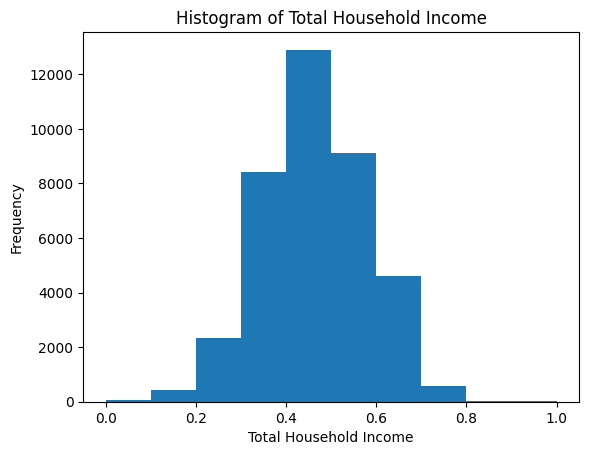

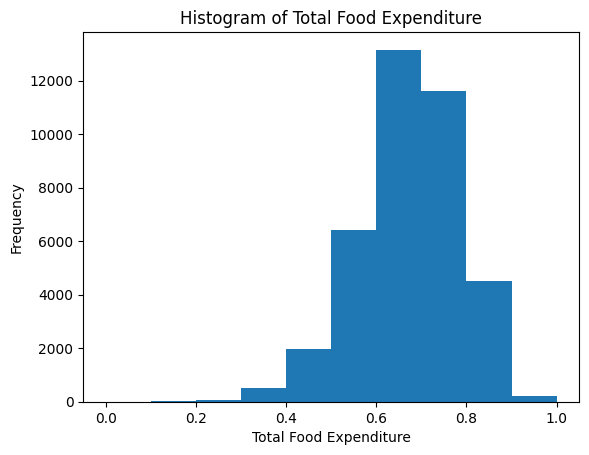

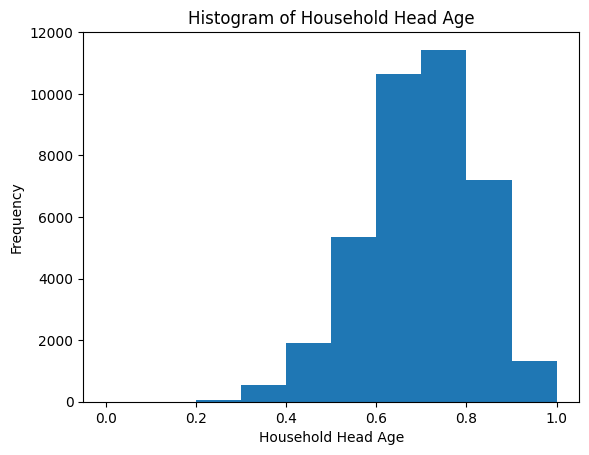

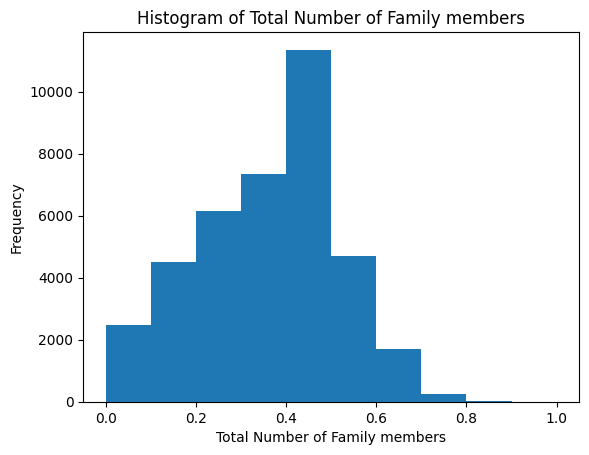

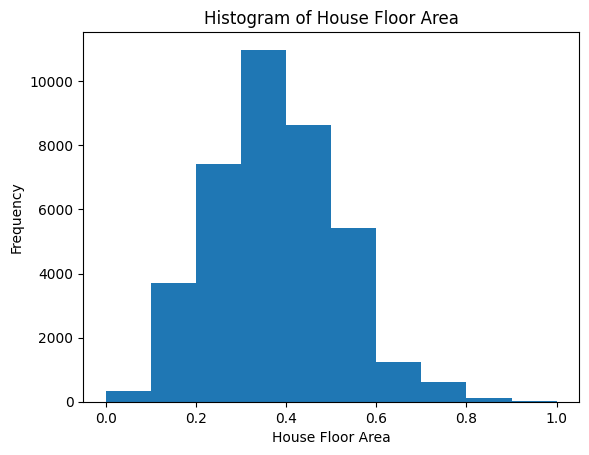

...

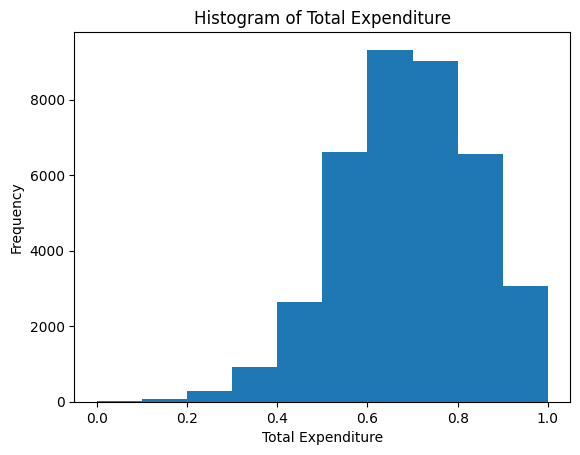

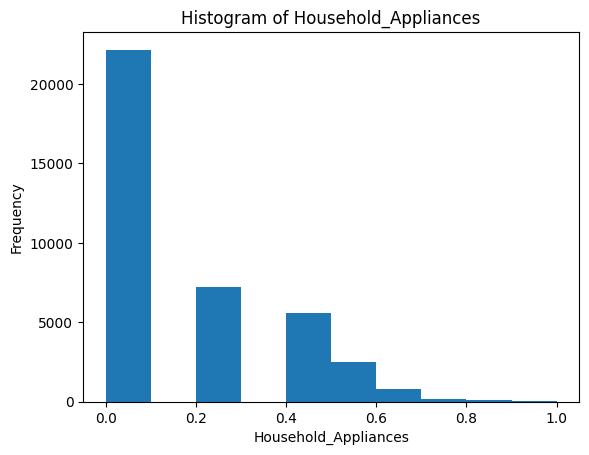

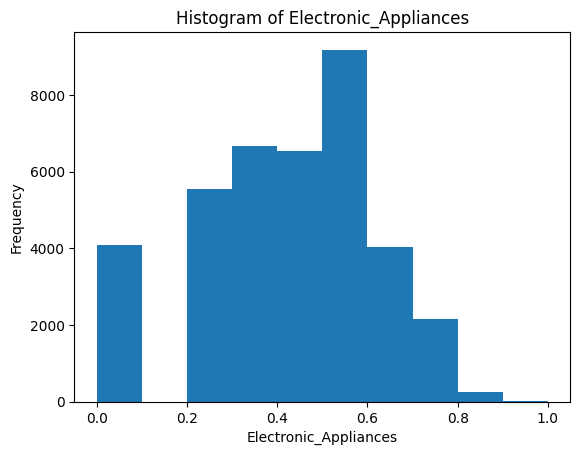

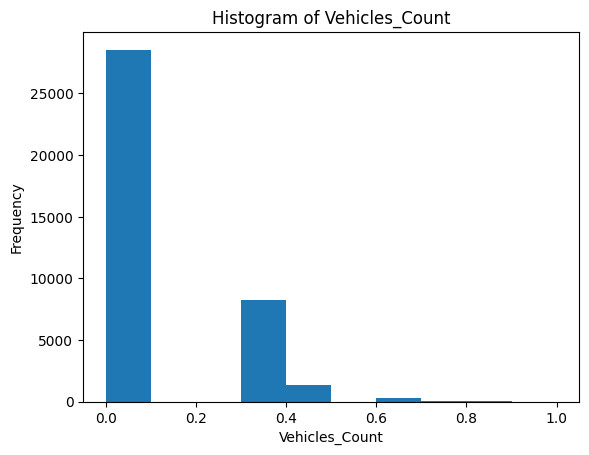

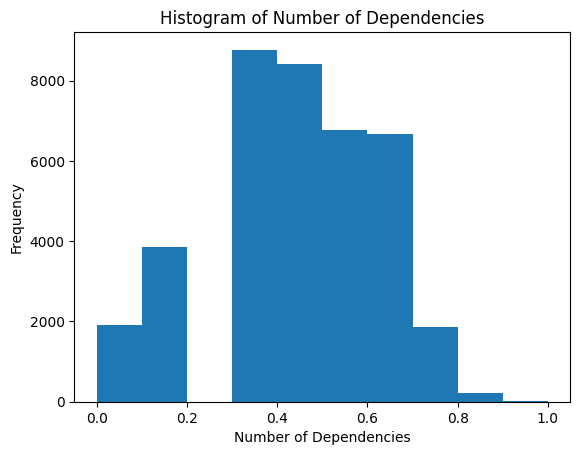

In [ ]:
# Histogram for all Numerical Columns, individually
for col in numerical_columns:
    plt.hist(df_copy[col])
    plt.title(f'Histogram of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()

In [ ]:
# Fill Null Columns with 'Unknown'
df[null_columns] = df[null_columns].fillna('Unknown')
df_copy[null_columns] = df_copy[null_columns].fillna('Unknown')
df_extracted_outliers[null_columns] = df_extracted_outliers[null_columns].fillna('Unknown')

In [ ]:
# Dictionary to map occupations to industry sectors
industry_categories = {
    "Agriculture, forestry, and fishing": [
        'Farmhands and laborers', 'Rice farmers', 'Hog raising farmers', 'Vegetable farmers', 'Foresters and related scientists', 'Inland and coastal waters fishermen', 'Production and operations managers in agriculture, hunting, forestry and fishery', 'Corn farmers', 'Coconut farmers', 'Root crops farmers', 'Fruit tree farmers', 'Coffee and cacao farmers', 'Forestry laborers', 'Other orchard farmers', 'General managers/managing proprietors in agriculture, hunting, forestry and fishing', 'Motorized farm and forestry plant operators', 'Fishery laborers and helpers', 'Duck raisers', 'Cotton and fiber crops farmers', 'Forest tree planters', 'Concessionaires and loggers', 'Minor forest products gatherers', 'Chicken farmers', 'Fish-farm cultivators (excluding prawns)', 'Ornamental plant growers', 'Cattle and dairy farmers', 'Other livestock farmers', 'Deep-sea fishermen', 'Other field crop farmers', 'Sugarcane farmers', 'Other poultry farmers', 'Field legumes farmers', 'Farm technicians', 'Other plant growers', 'Seaweeds cultivators', 'Fishermen n. e. c.', 'Drivers of animal-drawn vehicles and machinery', 'Hunting and trapping laborers', 'Other animal raisers', 'Hunters and trappers', 'Other aqua products cultivators', 'Tree nut farmers'
    ],
    "Mining and quarrying": [
        'Mining and quarrying laborers', 'Earth-moving and related plant operators', 'Miners and quarry workers', 'Shotfirers and blasters', 'Mining-plant operators', 'Well drillers and borers and related workers', 'Mineral ore and stone-processing plant operators'
    ],
    "Manufacturing": [
        'Electronics mechanics and servicers', 'Welders and flamecutters', 'General managers/managing proprietors in manufacturing', 'Hand packers and other manufacturing laborers', 'Tailors, dressmakers and hatters', 'Wood and related products assemblers', 'Assembling laborers', 'Mechanical engineering technicians', 'Production supervisors and general foremen', 'Food preservers', 'Basketry weavers, brush makers and related workers', 'Wood products machine operators', 'Chemical processing plant operators n. e. c.', 'Cabinet/furniture makers and related workers', 'Blacksmiths, hammersmiths, and forging-press workers', 'Wood processing plant operators', 'Fruit, vegetable and nut processing machine operators', 'Rattan, bamboo and other wicker furniture makers', 'Rubber products machine operators', 'Sheet-metal workers', 'Handicraft workers in wood and related materials', 'Weavers, knitters and related workers', 'Cement and other mineral products machine operators', 'Silk-screen, block and textile printers', 'Grain and spice milling machine operators', 'Production and operations managers in manufacturing', 'Other machine operators and assemblers', 'Sewers, Embroiderers and related workers', 'Electronic equipment assemblers', 'Textile, leather and related patternmakers and cutters', 'Metal-wheel grinders, polishers and tool sharpeners', 'Metal finishing, plating and coating machine operators', 'Charcoal makers and related workers', 'Automated assembly-line operators', 'Sugar production machine operators', 'Glass makers, cutters, grinders and finishers', 'Tool-makers and related workers', 'Dairy products makers', 'Meat and fish processing machine operators', 'Metal melters, caster and rolling mill operators', 'Weaving and knitting machine operators', 'Mechanical machinery assemblers', 'Metal drawers and extruders', 'Precision instrument makers and repairers', 'Compositors, typesetters and related workers', 'Electrical equipment assemblers', 'Metal, rubber and plastic products assemblers', 'Baked goods and cereal and chocolate products machine operators', 'Metal molders and coremakers', 'Marine craft mechanics', 'Bookbinders and related workers', 'Jewelry and precious metal workers', 'Musical instrument makers and tuners', 'Machine-tool setters and setter operators', 'Stone splitters, cutters and carvers', 'Woodworking machine setters and setter-operators', 'Food and beverage tasters and graders', 'Pressman letterpresses and related workers', 'Shoemakers and related workers', 'Agricultural or industrial machinery mechanics and fitters', 'Upholsterers and related workers', 'Machine tool operators', 'Technician, skilled, semi-skilled workers', 'Tobacco preparers and tobacco products makers', 'Brewers and wine and other beverage machine operators', 'Papermaking plant operators', 'Pharmaceutical and toiletry products machine operators', 'Paperboard, textile and related products assemblers', 'Plastic products machine operators', 'Industrial robot operators', 'Dairy products machine operators', 'Petroleum and natural gas refining plant operators', 'Builders (traditional materials)', 'Fiber preparing, spinning and winding machine operators', 'Shoemaking and related machine operators', 'Potters and related clay and abrasive formers', 'Fiber preparers', 'Glass and ceramics kiln and related machine operators', 'Textile and leather products machine operators n. e. c.', 'Chemical products machine operators n. e. c.', 'Paper pulp plant operators', 'Sewing machine operators', 'Glass, ceramics and related plant operators n. e. c.'
    ],
    "Electricity, gas, steam and air conditioning supply": [
        'Lineman, line installers and cable splicers', 'Building and related electricians', 'Power production plant operators', 'Electrical mechanics and fitters', 'Riggers and cable splicers', 'Electronics fitters'
    ],
    "Water supply, sewerage, waste management and remediation activities": [
        'Garbage collectors', 'Incinerator, water treatment and related plant operators'
    ],
    "Construction": [
        'Carpenters and joiners', 'Building construction laborers', 'Masons and related concrete finishers', 'Painters and related workers', 'Construction and maintenance laborers: roads, dams and similar constructions', 'Plumbers, pipe fitters and other related workers', 'General managers/managing proprietors in construction', 'Varnishers and related painters', 'Structural-metal preparers, erectors and related workers', 'Roofers', 'Production and operations managers in construction', 'Building frame and related trades workers n. e. c.', 'Crane, hoist and related plant operators', 'Floor layers and tile setters', 'Insulation workers', 'Wood treaters'
    ],
    "Wholesale and retail trade; repair of motor vehicles and motorcycles": [
        'General managers/managing proprietors in wholesale and retail trade', 'Stocks clerks', 'Shop salespersons and demonstrators', 'Motor vehicle mechanics and related trades workers', 'Door-to-door and telephone salespersons', 'Street ambulant vendors', 'Butchers, fishmongers and related food preparers', 'Market and sidewalk stall vendors', 'Stall and market salespersons', 'Cashiers and ticket clerks', 'Sales and marketing managers', 'Production and operations managers in wholesale and retail trade', 'Sales supervisors in retail trade', 'Buyers', 'Sales supervisors in wholesale trade', 'Other sales supervisors', 'Supply and distribution managers'
    ],
    "Transportation and storage": [
        'Transport conductors', 'Heavy truck and lorry drivers','General managers/managing proprietors in transportation, storage and communications', 'Car, taxi and van drivers', 'Motorcycle drivers', "Ship's deck crews and related workers", "Ships' deck officers and pilots", 'Freight handlers', 'Transport clerks', 'Lifting truck operators', 'Production and operations managers in transport, storage and communications', 'Transport and communications service supervisors n. e. c.', 'Bus drivers', 'Mail carriers and sorting clerks', 'Hand or pedal vehicle drivers', 'Air transport service supervisors', 'Ship and aircraft controllers and technicians', 'Aircraft engine mechanics and fitters', 'Air traffic safety technicians', 'Maritime transport service supervisors', 'Locomotive engine drivers', 'Aircraft pilots, navigators and flight engineers'
    ],
    "Accommodation and food service activities": [
        'General managers/managing proprietors of restaurants and hotels', 'Cooks', 'Production and operations managers in restaurant and hotels', 'Waiters, waitresses and bartenders', 'Bakers, pastry cooks and confectionery makers', 'Housekeepers and related workers'
    ],
    "Information and communication": [
        'Broadcasting and telecommunications equipment operators', 'Data entry operators', 'Computer equipment operators', 'Other computer professionals', 'Computer programmers', 'Systems analysts and designers', 'Computer assistants', 'Telecommunication equipment installers and repairers', 'Postal service supervisors', 'Coding, proof-reading and related clerks', 'Telephone switchboard operators', 'Advertising and public relations managers'
    ],
    "Financial and insurance activities": [
        'Tellers and other counter clerks', 'Statistical and finance clerks', 'Accounting and bookkeeping clerks', 'Debt collectors and related workers', 'Pawnbrokers and money lenders', 'Accountants and auditors', 'Bookkeepers', 'Finance and administration managers', 'Insurance representatives', 'Trade brokers', 'Other finance and sales associate professionals', 'Other business services and trade brokers'
    ],
    "Real estate activities": [
        'Estate agents', 'Appraisers and valuers'
    ],
    "Professional, Scientific and Technical Activities": [
        'Other social science professionals', 'Statistical, mathematical and related associate professionals', 'Civil engineers', 'Mechanical engineers', 'Agronomists and related scientists', 'Research and development managers', 'Professional, technical and related officers', 'Technical and commercial sales representatives', 'Architects', 'Electrical Engineers', 'Mining and metallurgical engineering technicians', 'Draftsmen', 'Computer engineers and related professionals', 'Other life science technicians', 'Legal and related business associate professionals', 'Other business professionals', 'Economists', 'Chemists', 'Civil engineering technicians', 'Statisticians', 'Electronics and communications engineers', 'Personnel and human resource development professionals', 'Librarians, archivists and curators', 'Town planners and related professionals', 'Electronics and communications engineering technicians', 'Industrial engineers', 'Lawyers', 'Other physical science and engineering technicians', 'Chemical engineers', 'Geodetic engineers and related professionals', 'Business machines mechanics and repairers', 'Life science technicians', 'Other engineers and related professionals', 'Electrical engineering technicians'
    ],
    "Administrative and Support Service Activities": [
        'Secretaries', 'General managers/managing proprietors n. e. c.', 'Messengers, package and luggage porters and deliverers', 'Other office clerks', 'General managers/managing proprietors of business services', 'Other supervisors, n. e. c.', 'Building caretakers', 'Doorkeepers, watchpersons and related workers', 'Personnel and industrial relations managers', 'Library and filing clerks', 'Other administrative associate professionals', 'Safety, health and quality inspectors (vehicles, processes and products)', 'Labor contractors and employment agents', 'Other specialized managers', 'Receptionists and information clerks', 'Administrative secretaries and related associate professionals', 'Word processor and related operators', 'Production clerks', 'Travel consultants and organizers', 'Stenographers and typists', 'Production and operations managers in business services'
    ],
    "Education": [
        'General elementary education teaching professionals', 'College, university and higher education teaching professionals', 'School supervisors and principals', 'School principals', 'General secondary education teaching professionals', 'Vocational education teaching professionals', 'Teaching associate professionals', 'Education methods specialists', 'Pre-elementary education teaching professionals', 'Technical and vocational instructors/trainors', 'Nonformal education teaching professionals other than technical and vocational trainors/instructors', 'Science and mathematics teaching professionals', 'Science and mathematics elementary education teaching professionals', 'Other teaching professionals'
    ],
    "Human Health and Social Work Activities": [
        'Social work associate professionals', 'Medical technologists', 'Child care workers', 'Institution-based personal care workers', 'Traditional medicine practitioners', 'Midwifery associate professionals', 'Professional nurses', 'Veterinary assistants', 'Pharmacists', 'Nutritionists-dietitians', 'Professional midwives', 'Home-based personal care workers', 'Other health associate professionals (except nursing)', 'Medical assistants', 'Medical doctors', 'Faith healers', 'Dentists', 'Social work professionals', 'Other health professionals (except nursing)', 'Dental assistants', 'Pharmaceutical assistants', 'Medical equipment operators', 'Nursing associate professionals', 'Physiotherapists', 'Optometrists and opticians', 'Veterinarians'
    ],
    "Arts, Entertainment and Recreation": [
        'Bet bookmakers and croupiers', 'Choreographers and dancers', 'Athletes and related workers', 'Decorators and commercial designers', 'Street, nightclub and related musicians, singers and dancers', 'Composers, musicians and singers', 'Photographers and image and sound recording equipment operators', 'Fashion and other models', 'Sculptors, painters and related artists', 'Photographic and related workers', 'Radio, television and other announcers', 'Authors, journalists and other writers', 'Other creative or performing artists'
    ],
    "Other service activities": [
        'Helpers and cleaners in offices, hotels and other establishments', 'Hand launderers and pressers', 'Sweepers and related laborers', 'Non-ordained religious associate professionals', 'Religious professionals', 'Domestic helpers and cleaners', 'General managers/managing proprietors in personal care, cleaning and relative services', 'Photographic products machine operators', 'Undertakers and embalmers', 'Hairdressers, barbers, beauticians and related workers', 'Shoe cleaning and other street services elementary occupations', 'Personal care and related workers, n. e. c.', 'Production and operations managers in personal care, cleaning and relative services', 'Other personal services workers, n. e. c.', 'Companions and valets', 'Travel guides', 'Bleaching, dyeing and cleaning machine operators', 'Service and related workers', 'Vehicle, window and related cleaners', 'Tanners'
    ],
    "Government and Public Service": [
        'Justices', 'Protective services workers n. e. c.', 'Traditional chiefs and heads of villages', 'Legislative officials', 'Police inspectors and detectives', 'Prison guards', 'Government administrators (including career executive service officers)', 'Police officers', 'Enlisted personnel n. e. c.', 'Combat soldiers', 'Firefighters', 'Staff officers', 'Government tax and excise officials', 'Commanding officers', 'Customs and immigration inspectors', 'Government licensing officials', 'Senior officials of humanitarian and other special-interest organizations', 'Building and fire inspectors', 'Other government associate professionals', 'Government social benefits officials', 'Officers, n. e. c.'
    ],
    "Workers reporting occupations unidentifiable or inadequately defined":[
        'Workers reporting occupations unidentifiable or inadequately defined'
    ],
    "Directors and chief executives of corporations": [
        'Directors and chief executives of corporations'
    ]
}

In [ ]:
# Reverse mapping for faster lookup
occupation_to_industry = {}
for industry, occupations in industry_categories.items():
    for occupation in occupations:
        occupation_to_industry[occupation] = industry

In [ ]:
# Categorizing the jobs
categorized_jobs = {industry: [] for industry in industry_categories}
for job in df['Household Head Occupation']:
    category = occupation_to_industry.get(job, 'Uncategorized')
    if category in categorized_jobs:
        categorized_jobs[category].append(job)
    else:
        categorized_jobs['Uncategorized'] = [job]

In [ ]:
# Printing the categorized jobs before applying to DataFrame
for category, jobs in categorized_jobs.items():
    print(f"{category}:")
    print(jobs)
    print('-' * 40)

Agriculture, forestry, and fishing:
['Farmhands and laborers', 'Rice farmers', 'Rice farmers', 'Rice farmers', 'Hog raising farmers', 'Farmhands and laborers', 'Rice farmers', 'Rice farmers', 'Rice farmers', 'Rice farmers', 'Rice farmers', 'Rice farmers', 'Rice farmers', 'Rice farmers', 'Vegetable farmers', 'Vegetable farmers', 'Rice farmers', 'Rice farmers', 'Rice farmers', 'Rice farmers', 'Rice farmers', 'Vegetable farmers', 'Rice farmers', 'Rice farmers', 'Rice farmers', 'Foresters and related scientists', 'Farmhands and laborers', 'Rice farmers', 'Rice farmers', 'Rice farmers', 'Rice farmers', 'Rice farmers', 'Rice farmers', 'Rice farmers', 'Rice farmers', 'Rice farmers', 'Rice farmers', 'Rice farmers', 'Rice farmers', 'Farmhands and laborers', 'Rice farmers', 'Rice farmers', 'Farmhands and laborers', 'Rice farmers', 'Rice farmers', 'Rice farmers', 'Farmhands and laborers', 'Rice farmers', 'Rice farmers', 'Rice farmers', 'Rice farmers', 'Rice farmers', 'Rice farmers', 'Rice farmers

In [ ]:
# Define function 'categorize_occupation'
def categorize_occupation(occupation):
    for industry, occupations in industry_categories.items():
        if occupation in occupations:
            return industry
    return 'Uncategorized'

In [ ]:
df['Household Head Occupation'] = df['Household Head Occupation'].apply(categorize_occupation)
df_copy['Household Head Occupation'] = df_copy['Household Head Occupation'].apply(categorize_occupation)
df_extracted_outliers['Household Head Occupation'] = df_extracted_outliers['Household Head Occupation'].apply(categorize_occupation)

In [ ]:
df_copy['Household Head Occupation'].value_counts()

,count
Household Head Occupation,
"Agriculture, forestry, and fishing",13188
Uncategorized,6734
Transportation and storage,3955
Wholesale and retail trade; repair of motor vehicles and motorcycles,3801
Construction,2914
Manufacturing,1887
Government and Public Service,1270
Administrative and Support Service Activities,1200
Other service activities,1188


In [ ]:
highest_educational_attainment = {
    0 : [
        'No Grade Completed'
    ],
    1 : [
        'Preschool'
    ],
    2 :[
        'Elementary Graduate'
    ],
    3 :[
        'Grade 4','Grade 5', 'Grade 3', 'Grade 2', 'Grade 1', 'Grade 6'
    ],
    4 :[
        'High School Graduate'
    ],
    5 :[
        'Second Year High School', 'Third Year High School', 'First Year High School'
    ],
    6 :[
        'Third Year College', 'First Year College', 'Second Year College', 'First Year Post Secondary',
        'Second Year Post Secondary', 'Fourth Year College',
        'Other Programs in Education at the Third Level, First Stage, of the Type that Leads to an Award not Equivalent to a First University or Baccalaureate Degree',
        'Other Programs of Education at the Third Level, First Stage, of the Type that Leads to a Baccalaureate or First University/Professional Degree (HIgher Education Level, First Stage, or Collegiate Education Level)'
    ],
    7 : [
        'Business and Administration Programs', 'Teacher Training and Education Sciences Programs',
        'Engineering and Engineering Trades Programs', 'Engineering and Engineering trades Programs',
        'Health Programs', 'Computing/Information Technology Programs', 'Security Services Programs',
        'Agriculture, Forestry, and Fishery Programs', 'Transport Services Programs',
        'Social and Behavioral Science Programs', 'Personal Services Programs', 'Humanities Programs',
        'Law Programs', 'Basic Programs', 'Architecture and Building Programs', 'Journalism and Information Programs',
        'Arts Programs', 'Life Sciences Programs', 'Manufacturing and Processing Programs', 'Mathematics and Statistics Programs',
        'Social Services Programs', 'Physical Sciences Programs', 'Veterinary Programs', 'Environmental Protection Programs'
    ],
    8 : [
        'Post Baccalaureate'
    ]
}

In [ ]:
print(type(highest_educational_attainment))  # Should be <class 'dict'>
print(highest_educational_attainment)        # Check its contents

<class 'dict'>
{0: ['No Grade Completed'], 1: ['Preschool'], 2: ['Elementary Graduate'], 3: ['Grade 4', 'Grade 5', 'Grade 3', 'Grade 2', 'Grade 1', 'Grade 6'], 4: ['High School Graduate'], 5: ['Second Year High School', 'Third Year High School', 'First Year High School'], 6: ['Third Year College', 'First Year College', 'Second Year College', 'First Year Post Secondary', 'Second Year Post Secondary', 'Fourth Year College', 'Other Programs in Education at the Third Level, First Stage, of the Type that Leads to an Award not Equivalent to a First University or Baccalaureate Degree', 'Other Programs of Education at the Third Level, First Stage, of the Type that Leads to a Baccalaureate or First University/Professional Degree (HIgher Education Level, First Stage, or Collegiate Education Level)'], 7: ['Business and Administration Programs', 'Teacher Training and Education Sciences Programs', 'Engineering and Engineering Trades Programs', 'Engineering and Engineering trades Programs', 'Health 

In [ ]:
def check_education_categorization(df, column_name, highest_educational_attainment):
    # Reverse mapping: Create a lookup dictionary for fast categorization
    education_to_category = {}
    for category, levels in highest_educational_attainment.items():
        for level in levels:
            education_to_category[level] = category

    # Dictionary to store categorized entries
    categorized_levels = {category: [] for category in highest_educational_attainment}
    categorized_levels["Uncategorized"] = []  # To capture unmatched entries

    # Categorize each entry in the DataFrame
    for edu in df[column_name]:
        category = education_to_category.get(edu, "Uncategorized")
        categorized_levels[category].append(edu)

    # Print categorized results for validation
    for category, levels in categorized_levels.items():
        print(f"{category} ({len(levels)} entries):")
        print(levels[:10])  # Show a sample of 10 for readability
        print('-' * 50)

    # Return categorized results (optional)
    return categorized_levels

In [ ]:
categorized_results = check_education_categorization(df_copy, 'Household Head Highest Grade Completed', highest_educational_attainment)

0 (1224 entries):
['No Grade Completed', 'No Grade Completed', 'No Grade Completed', 'No Grade Completed', 'No Grade Completed', 'No Grade Completed', 'No Grade Completed', 'No Grade Completed', 'No Grade Completed', 'No Grade Completed']
--------------------------------------------------
1 (15 entries):
['Preschool', 'Preschool', 'Preschool', 'Preschool', 'Preschool', 'Preschool', 'Preschool', 'Preschool', 'Preschool', 'Preschool']
--------------------------------------------------
2 (7445 entries):
['Elementary Graduate', 'Elementary Graduate', 'Elementary Graduate', 'Elementary Graduate', 'Elementary Graduate', 'Elementary Graduate', 'Elementary Graduate', 'Elementary Graduate', 'Elementary Graduate', 'Elementary Graduate']
--------------------------------------------------
3 (8692 entries):
['Grade 3', 'Grade 6', 'Grade 4', 'Grade 3', 'Grade 2', 'Grade 5', 'Grade 3', 'Grade 4', 'Grade 4', 'Grade 4']
--------------------------------------------------
4 (9094 entries):
['High School 

In [ ]:
# Define function 'Household Highest Educational Attaintment'
def categorize_highest_educational_attainment(education):
    for category, educational_levels in highest_educational_attainment.items():
        if education in educational_levels:
            return category
    return 'Uncategorized'

In [ ]:
# Apply to 'Household Head Highest Grade Completed'
df['Household Head Highest Grade Completed'] = df['Household Head Highest Grade Completed'].apply(categorize_highest_educational_attainment)
df_copy['Household Head Highest Grade Completed'] = df_copy['Household Head Highest Grade Completed'].apply(categorize_highest_educational_attainment)
df_extracted_outliers['Household Head Highest Grade Completed'] = df_extracted_outliers['Household Head Highest Grade Completed'].apply(categorize_highest_educational_attainment)

In [ ]:
df_copy['Household Head Highest Grade Completed'].value_counts()

,count
Household Head Highest Grade Completed,
4,9094
3,8692
2,7445
5,4770
7,3969
6,3167
0,1224
8,108
1,15


In [ ]:
type_of_roof_classification = {
    0 : [
        'Not Applicable'
    ],
    1 : [
        'Salvaged/makeshift materials', 'Mixed but predominantly salvaged materials'
    ],
    2 :[
        'Mixed but predominantly light materials', 'Light material (cogon,nipa,anahaw)'
    ],
    3 :[
        'Mixed but predominantly strong materials', 'Strong material(galvanized,iron,al,tile,concrete,brick,stone,asbestos)'
    ],
    4 :[
        'High School Graduate'
    ],
}

In [ ]:
# Function to categorize_roof_classification
def categorize_roof_classification(roof_classification):
    for category, roof_levels in type_of_roof_classification.items():
        if roof_classification in roof_levels:
            return category
    return 'Uncategorized'

In [ ]:
# Apply classification to type of roof
df_copy['Type of Roof'] = df_copy['Type of Roof'].apply(categorize_roof_classification)

In [ ]:
wall_mapping = {
    'Very Light': 2,
    'Light': 3,
    'Salvaged': 1,
    'Quite Strong': 4,
    'Strong': 5,
    'NOt applicable': 0
}

In [ ]:
# Map Type of Wall
df_copy['Type of Walls'] = df_copy['Type of Walls'].map(wall_mapping)

In [ ]:
toilet_maping = {
    'Unknown': 0,
    'Open pit': 2,
    'Closed pit': 3,
    'Others': 1,
    'Water-sealed, other depository, shared with other household': 4,
    'Water-sealed, other depository, used exclusively by household': 5,
    'Water-sealed, sewer septic tank, shared with other household': 6,
    'Water-sealed, sewer septic tank, used exclusively by household': 7
}

In [ ]:
# Map Toilet Facilities
df_copy['Toilet Facilities'] = df_copy['Toilet Facilities'].map(toilet_maping)

In [ ]:
df_copy['Toilet Facilities'].value_counts()

,count
Toilet Facilities,
7,26230
6,3636
5,2280
3,2270
0,1579
2,1189
4,948
1,352


In [ ]:
water_mapping = {
    'Lake, river, rain and others': 2,
    'Unprotected spring, river, stream, etc': 3,
    'Dug well': 4,
    'Tubed/piped shallow well': 5,
    'Protected spring, river, stream, etc': 6,
    'Shared, tubed/piped deep well': 7,
    'Shared, faucet, community water system': 8,
    'Own use, tubed/piped deep well': 9,
    'Own use, faucet, community water system': 10,
    'Peddler': 0,
    'Others': 1
    }

In [ ]:
# Map Main Source of Water Supply
df_copy['Main Source of Water Supply'] = df_copy['Main Source of Water Supply'].map(water_mapping)

In [ ]:
# One Hot Selected Columns
df = pd.get_dummies(df, columns=['Main Source of Income',
                                           'Household Head Sex',
                                           'Household Head Job or Business Indicator',
                                           'Type of Household'], drop_first=True)

df_copy = pd.get_dummies(df_copy, columns=['Main Source of Income',
                                           'Household Head Sex',
                                           'Household Head Job or Business Indicator',
                                           'Type of Household'], drop_first=True)

df_extracted_outliers = pd.get_dummies(df_extracted_outliers, columns=['Main Source of Income',
                                           'Household Head Sex',
                                           'Household Head Job or Business Indicator',
                                           'Type of Household'], drop_first=True)

In [ ]:
''' Label Encode Selected Columns :'Region', 'Household Head Occupation ''Household Head Marital Status', 'Tenure Status', 'Type of Building/House',
                                           'Household Head Class of Worker' '''

" Label Encode Selected Columns :'Region', 'Household Head Occupation ''Household Head Marital Status', 'Tenure Status', 'Type of Building/House',\n                                           'Household Head Class of Worker' "

In [ ]:
from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()
df_copy['Region'] = label_encoder.fit_transform(df_copy['Region'])
df_copy['Household Head Marital Status'] = label_encoder.fit_transform(df_copy['Household Head Marital Status'])
df_copy['Tenure Status'] = label_encoder.fit_transform(df_copy['Tenure Status'])
df_copy['Type of Building/House'] = label_encoder.fit_transform(df_copy['Type of Building/House'])
df_copy['Household Head Class of Worker'] = label_encoder.fit_transform(df_copy['Household Head Class of Worker'])
df_copy['Household Head Occupation'] = label_encoder.fit_transform(df_copy['Household Head Occupation'])

In [ ]:
df_extracted_outliers['Region'] = label_encoder.fit_transform(df_extracted_outliers['Region'])
df_extracted_outliers['Household Head Marital Status'] = label_encoder.fit_transform(df_extracted_outliers['Household Head Marital Status'])
df_extracted_outliers['Tenure Status'] = label_encoder.fit_transform(df_extracted_outliers['Tenure Status'])
df_extracted_outliers['Type of Building/House'] = label_encoder.fit_transform(df_extracted_outliers['Type of Building/House'])
df_extracted_outliers['Household Head Class of Worker'] = label_encoder.fit_transform(df_extracted_outliers['Household Head Class of Worker'])
df_extracted_outliers['Household Head Occupation'] = label_encoder.fit_transform(df_extracted_outliers['Household Head Occupation'])

In [ ]:
df_copy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 38484 entries, 0 to 38483
Data columns (total 33 columns):
 #   Column                                                      Non-Null Count  Dtype  
---  ------                                                      --------------  -----  
 0   Total Household Income                                      38484 non-null  float64
 1   Region                                                      38484 non-null  int64  
 2   Total Food Expenditure                                      38484 non-null  float64
 3   Agricultural Household indicator                            38484 non-null  int64  
 4   Household Head Age                                          38484 non-null  float64
 5   Household Head Marital Status                               38484 non-null  int64  
 6   Household Head Highest Grade Completed                      38484 non-null  int64  
 7   Household Head Occupation                                   38484 non-null  int64  
 

In [ ]:
df_copy.head()

,Total Household Income,Region,Total Food Expenditure,Agricultural Household indicator,Household Head Age,Household Head Marital Status,Household Head Highest Grade Completed,Household Head Occupation,Household Head Class of Worker,Total Number of Family members,...,Household_Appliances,Electronic_Appliances,Vehicles_Count,Number of Dependencies,Main Source of Income_Other sources of Income,Main Source of Income_Wage/Salaries,Household Head Sex_Male,Household Head Job or Business Indicator_With Job/Business,Type of Household_Single Family,Type of Household_Two or More Nonrelated Persons/Members
0,0.660792,1,0.793200,0,0.698970,3,7,6,3,0.352055,...,0.458157,0.571444,0.315465,0.445714,False,True,False,True,False,False
1,0.504880,1,0.674202,0,0.612784,2,7,17,4,0.266320,...,0.289065,0.663194,0.500000,0.304247,False,True,True,True,True,False
2,0.351050,1,0.653717,1,0.602060,2,3,2,4,0.481334,...,0.000000,0.000000,0.000000,0.575876,False,True,True,True,True,False
3,0.397218,1,0.704969,0,0.724276,2,2,2,0,0.266320,...,0.000000,0.350379,0.000000,0.445714,False,True,True,True,True,False
4,0.496775,1,0.746001,0,0.819544,2,2,17,1,0.352055,...,0.289065,0.513296,0.315465,0.304247,False,True,True,True,True,False


In [ ]:
df_copy.isna().sum()

,0
Total Household Income,0
Region,0
Total Food Expenditure,0
Agricultural Household indicator,0
Household Head Age,0
Household Head Marital Status,0
Household Head Highest Grade Completed,0
Household Head Occupation,0
Household Head Class of Worker,0
Total Number of Family members,0


In [ ]:
df_copy.duplicated().sum()

0

In [ ]:
# Drop Unrelated Columns
df_copy.drop(['Total Food Expenditure'], axis=1, inplace=True)
df_copy.drop(['Total_Essential_Spending'], axis=1, inplace=True)
df_copy.drop(['Total_NonEssential_Spending'], axis=1, inplace=True)
df_copy.drop(['Type of Roof'], axis=1, inplace=True)
df_copy.drop(['Type of Walls'], axis=1, inplace=True)
df_copy.drop(['Household Head Class of Worker'], axis=1, inplace=True)
df_copy.drop(['Number of bedrooms', 'Household Head Age', 'House Age'], axis=1, inplace=True)
df_copy.drop(['Tenure Status', 'Toilet Facilities', 'Electricity', 'Main Source of Water Supply', 'Vehicles_Count'], axis=1, inplace=True)
df_copy.drop(['Type of Household_Single Family', 'Type of Household_Two or More Nonrelated Persons/Members', 'Type of Building/House'], axis=1, inplace=True)

In [ ]:
df_extracted_outliers.drop(['Total Food Expenditure'], axis=1, inplace=True)
df_extracted_outliers.drop(['Total_Essential_Spending'], axis=1, inplace=True)
df_extracted_outliers.drop(['Total_NonEssential_Spending'], axis=1, inplace=True)
df_extracted_outliers.drop(['Type of Roof'], axis=1, inplace=True)
df_extracted_outliers.drop(['Type of Walls'], axis=1, inplace=True)
df_extracted_outliers.drop(['Household Head Class of Worker'], axis=1, inplace=True)
df_extracted_outliers.drop(['Number of bedrooms', 'Household Head Age', 'House Age'], axis=1, inplace=True)
df_extracted_outliers.drop(['Tenure Status', 'Toilet Facilities', 'Electricity', 'Main Source of Water Supply', 'Vehicles_Count'], axis=1, inplace=True)
df_extracted_outliers.drop(['Type of Household_Single Family', 'Type of Household_Two or More Nonrelated Persons/Members', 'Type of Building/House'], axis=1, inplace=True)

In [ ]:
df_copy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 38484 entries, 0 to 38483
Data columns (total 16 columns):
 #   Column                                                      Non-Null Count  Dtype  
---  ------                                                      --------------  -----  
 0   Total Household Income                                      38484 non-null  float64
 1   Region                                                      38484 non-null  int64  
 2   Agricultural Household indicator                            38484 non-null  int64  
 3   Household Head Marital Status                               38484 non-null  int64  
 4   Household Head Highest Grade Completed                      38484 non-null  int64  
 5   Household Head Occupation                                   38484 non-null  int64  
 6   Total Number of Family members                              38484 non-null  float64
 7   House Floor Area                                            38484 non-null  float64
 

In [ ]:
df_extracted_outliers.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3060 entries, 51 to 41043
Data columns (total 16 columns):
 #   Column                                                      Non-Null Count  Dtype  
---  ------                                                      --------------  -----  
 0   Total Household Income                                      3060 non-null   float64
 1   Region                                                      3060 non-null   int64  
 2   Agricultural Household indicator                            3060 non-null   int64  
 3   Household Head Marital Status                               3060 non-null   int64  
 4   Household Head Highest Grade Completed                      3060 non-null   int64  
 5   Household Head Occupation                                   3060 non-null   int64  
 6   Total Number of Family members                              3060 non-null   float64
 7   House Floor Area                                            3060 non-null   float64
 8   T

# Model Training

For cluster = 1, SSE/WCSS is 3227192.0527557163
For cluster = 2, SSE/WCSS is 1265623.193296692
For cluster = 3, SSE/WCSS is 879609.9801944847
For cluster = 4, SSE/WCSS is 625526.0817979338
For cluster = 5, SSE/WCSS is 532799.7126249755
For cluster = 6, SSE/WCSS is 478608.94097444403
For cluster = 7, SSE/WCSS is 433541.524541614
For cluster = 8, SSE/WCSS is 390825.7990094472
For cluster = 9, SSE/WCSS is 361648.1653364557
For cluster = 10, SSE/WCSS is 341017.36864401004


Text(0, 0.5, 'WCSS')

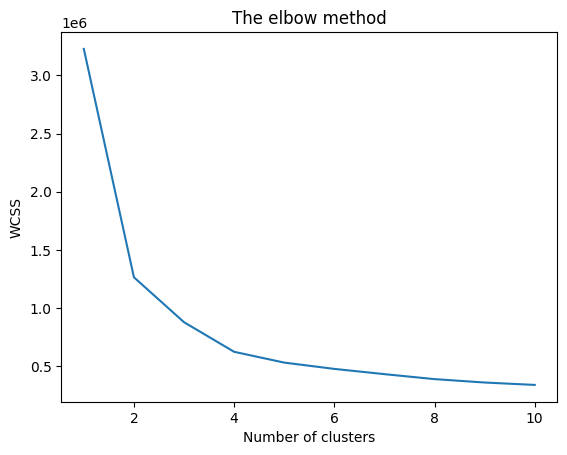

In [ ]:
# Use Elbow Method to find optimal KMeans
from sklearn.cluster import KMeans

wcss=[]
sse = {}
for i in range(1, 11):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', max_iter = 300,
                    n_init = 10, random_state = 0)
    kmeans.fit(df_copy)
    wcss.append(kmeans.inertia_)
    sse[i] = kmeans.inertia_
    print("For cluster = {}, SSE/WCSS is {}".format(i, sse[i]))

plt.plot(range(1, 11), wcss)
plt.title('The elbow method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')

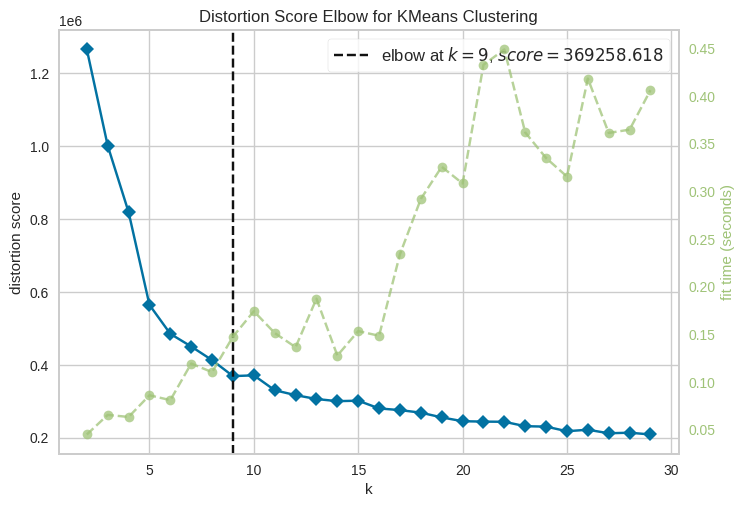

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [ ]:
from yellowbrick.cluster import KElbowVisualizer
model = KMeans()
# k is range of number of clusters.
visualizer = KElbowVisualizer(model, k=(2,30), timings= True)
visualizer.fit(df_copy)        # Fit data to visualizer
visualizer.show()        # Finalize and render figure

In [ ]:
from sklearn.metrics import silhouette_score
wcss = []

for k in range(2, 10):
  kmeans = KMeans(n_clusters= k,max_iter=100).fit(df_copy)
  label = kmeans.labels_
  sil_coeff = silhouette_score(df_copy,label,metric = 'euclidean')
  print('For cluster= {}, Silhouette Coefficient is {}'.format(k,sil_coeff))

For cluster= 2, Silhouette Coefficient is 0.5287936858222361
For cluster= 3, Silhouette Coefficient is 0.434219233766932
For cluster= 4, Silhouette Coefficient is 0.37904187523154087
For cluster= 5, Silhouette Coefficient is 0.4184400115161145
For cluster= 6, Silhouette Coefficient is 0.36677377900471725
For cluster= 7, Silhouette Coefficient is 0.30267145043529825
For cluster= 8, Silhouette Coefficient is 0.26384043385410344
For cluster= 9, Silhouette Coefficient is 0.30114219990816665


In [ ]:
from sklearn.metrics import silhouette_samples
import matplotlib.cm as cm

def visualize_silhouette(cluster_lists, X_features):

    n_cols = len(cluster_lists)
    fig, axs = plt.subplots(figsize=(4*n_cols, 4), nrows=1, ncols=n_cols)

    for ind, n_cluster in enumerate(cluster_lists):
        clusterer = KMeans(n_clusters = n_cluster, max_iter=500, random_state=0, init = 'k-means++')
        cluster_labels = clusterer.fit_predict(X_features)

        sil_avg = silhouette_score(X_features, cluster_labels)
        sil_values = silhouette_samples(X_features, cluster_labels)

        y_lower = 10
        axs[ind].set_title('Number of Cluster : '+ str(n_cluster)+'\n' \
                          'Silhouette Score :' + str(round(sil_avg,3)) )
        axs[ind].set_xlabel("The silhouette coefficient values")
        axs[ind].set_ylabel("Cluster label")
        axs[ind].set_xlim([-0.1, 1])
        axs[ind].set_ylim([0, len(X_features) + (n_cluster + 1) * 10])
        axs[ind].set_yticks([])  # Clear the yaxis labels / ticks
        axs[ind].set_xticks([0, 0.2, 0.4, 0.6, 0.8, 1])

        for i in range(n_cluster):
            ith_cluster_sil_values = sil_values[cluster_labels==i]
            ith_cluster_sil_values.sort()

            size_cluster_i = ith_cluster_sil_values.shape[0]
            y_upper = y_lower + size_cluster_i

            color = cm.nipy_spectral(float(i) / n_cluster)
            axs[ind].fill_betweenx(np.arange(y_lower, y_upper), 0, ith_cluster_sil_values, \
                                facecolor=color, edgecolor=color, alpha=0.7)
            axs[ind].text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))
            y_lower = y_upper + 10

        axs[ind].axvline(x=sil_avg, color="red", linestyle="--")

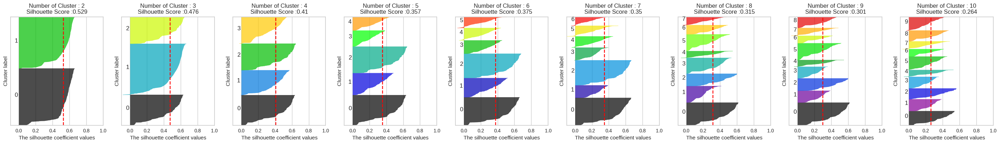

In [ ]:
visualize_silhouette([2, 3, 4, 5, 6, 7, 8, 9, 10], df_copy)

In [ ]:
# Perform PCA
from sklearn.decomposition import PCA

pca = PCA(n_components=10)
df_pca = pca.fit_transform(df_copy)

In [ ]:
cumsum = np.cumsum(pca.explained_variance_ratio_)
print(cumsum)
d = np.argmax(cumsum >= 0.90) + 1
print("dimension : ", d)

[0.67146175 0.93560622 0.97010505 0.98554144 0.9905851  0.99465551
 0.99600458 0.99710056 0.99803869 0.99888757 0.99944906 0.99965106
 0.99982607 0.99994643 0.99997904]
dimension :  2


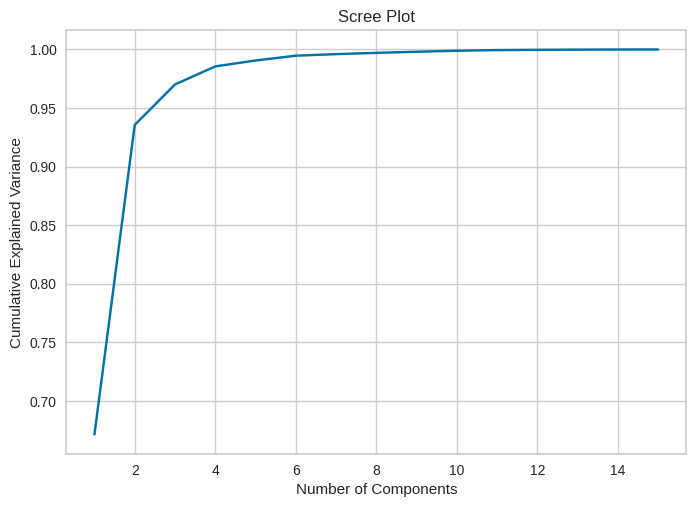

In [ ]:
# Display the Scree Plot and label where it hits 0.9 cumulative explained variance ratio
explained_variance = pca.explained_variance_ratio_
cumulative_variance = np.cumsum(explained_variance)
plt.plot(range(1, len(explained_variance) + 1), cumulative_variance)
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Scree Plot')
plt.show()

In [ ]:
# Analyze feature contributions to principal components
print("\nTop feature contributions to principal components:")
# Change component_names to reflect the number of components
component_names = [f"PC{i+1}" for i in range(pca.n_components_)]
# Now component_names will have 15 column names (PC1 to PC15)
loadings = pd.DataFrame(pca.components_.T, columns=component_names, index=df_copy.columns)


Top feature contributions to principal components:


In [ ]:
for i, pc in enumerate(component_names):
    sorted_loadings = loadings[pc].abs().sort_values(ascending=False)
    print(f"\n{pc} explains {pca.explained_variance_ratio_[i]:.2%} of variance")
    print(f"Top contributing features:")
    for j, (feature, loading) in enumerate(sorted_loadings.head(5).items()):
        sign = '+' if loadings.loc[feature, pc] > 0 else '-'
        print(f"  {j+1}. {feature}: {sign}{abs(loadings.loc[feature, pc]):.3f}")


PC1 explains 67.15% of variance
Top contributing features:
  1. Household Head Occupation: +0.998
  2. Household Head Highest Grade Completed: +0.041
  3. Household Head Marital Status: +0.032
  4. Household Head Job or Business Indicator_With Job/Business: -0.026
  5. Region: +0.021

PC2 explains 26.41% of variance
Top contributing features:
  1. Region: +1.000
  2. Household Head Occupation: -0.021
  3. Agricultural Household indicator: +0.008
  4. Main Source of Income_Wage/Salaries: +0.007
  5. Household Head Highest Grade Completed: +0.006

PC3 explains 3.45% of variance
Top contributing features:
  1. Household Head Highest Grade Completed: +0.983
  2. Household Head Marital Status: -0.158
  3. Household_Appliances: +0.046
  4. Electronic_Appliances: +0.042
  5. Household Head Occupation: -0.035

PC4 explains 1.54% of variance
Top contributing features:
  1. Household Head Marital Status: +0.952
  2. Household Head Sex_Male: -0.217
  3. Household Head Highest Grade Completed: +0

In [ ]:
pca = PCA(n_components=2)
df_pca = pca.fit_transform(df_copy)

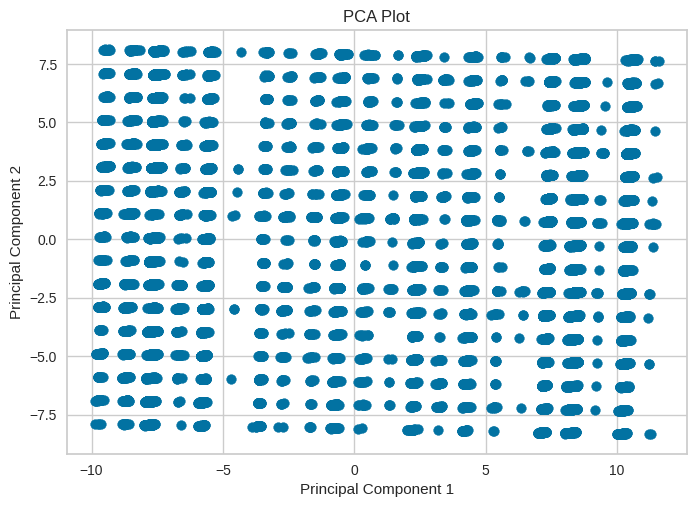

In [ ]:
# Plot PCA
plt.scatter(df_pca[:, 0], df_pca[:, 1])
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('PCA Plot')
plt.show()

In [ ]:
# Print Loading Scores
print(pca.components_)

[[ 3.23843447e-03  2.12479117e-02 -1.51145449e-02  3.23654743e-02
   4.05254251e-02  9.97740716e-01 -2.39188964e-03  2.41324784e-03
   2.27597630e-03  7.54737043e-03  5.48466340e-03 -1.83330110e-03
   8.52912884e-03 -2.02336433e-03 -1.63112761e-02 -2.61379072e-02]
 [-1.84210437e-03  9.99660287e-01  7.96554254e-03  4.08696366e-04
   6.37124297e-03 -2.13780021e-02 -1.42444055e-03 -5.18643271e-03
  -3.25907580e-03 -1.43504322e-03 -1.53466020e-03 -1.78428264e-03
   2.90087155e-03  7.38583499e-03 -9.92232863e-04  1.89506886e-03]]


For cluster = 1, SSE/WCSS is 3019380.9680085736
For cluster = 2, SSE/WCSS is 1057917.972676247
For cluster = 3, SSE/WCSS is 671976.2640448783
For cluster = 4, SSE/WCSS is 418604.11077523883
For cluster = 5, SSE/WCSS is 326056.88772935054
For cluster = 6, SSE/WCSS is 273019.29779131676
For cluster = 7, SSE/WCSS is 223240.28354704077
For cluster = 8, SSE/WCSS is 184360.53724444486
For cluster = 9, SSE/WCSS is 158249.18529024563
For cluster = 10, SSE/WCSS is 140103.50178446708


Text(0, 0.5, 'WCSS')

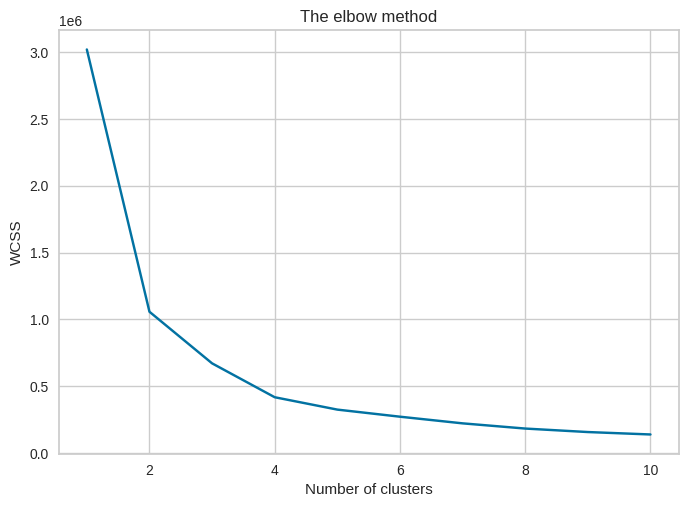

In [ ]:
# Use df_pca for K_Means
from sklearn.cluster import KMeans

wcss=[]
sse = {}
for i in range(1, 11):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', max_iter = 300,
                    n_init = 10, random_state = 0)
    kmeans.fit(df_pca)
    wcss.append(kmeans.inertia_)
    sse[i] = kmeans.inertia_
    print("For cluster = {}, SSE/WCSS is {}".format(i, sse[i]))

plt.plot(range(1, 11), wcss)
plt.title('The elbow method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')

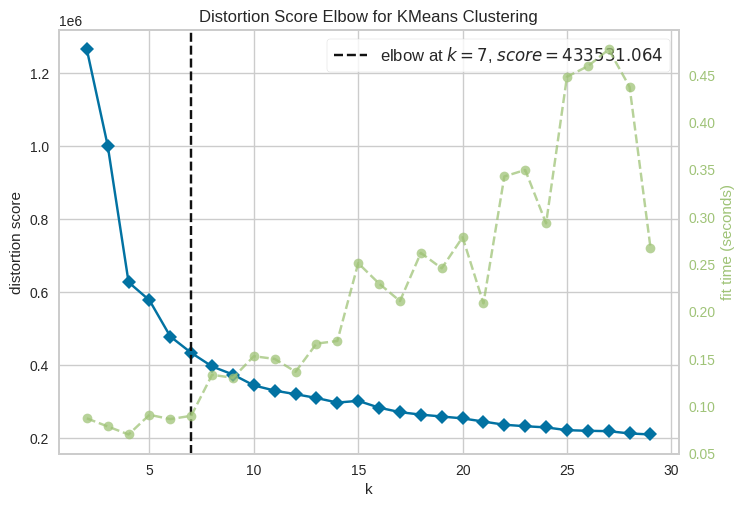

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [ ]:
from yellowbrick.cluster import KElbowVisualizer
model = KMeans()
# k is range of number of clusters.
visualizer = KElbowVisualizer(model, k=(2,30), timings= True)
visualizer.fit(df_copy)        # Fit data to visualizer
visualizer.show()        # Finalize and render figure

In [ ]:
from sklearn.metrics import silhouette_score
wcss = []

for k in range(2, 10):
  kmeans = KMeans(n_clusters= k,max_iter=100).fit(df_pca)
  label = kmeans.labels_
  sil_coeff = silhouette_score(df_pca,label,metric = 'euclidean')
  print('For cluster= {}, Silhouette Coefficient is {}'.format(k,sil_coeff))

For cluster= 2, Silhouette Coefficient is 0.5786111533775762
For cluster= 3, Silhouette Coefficient is 0.5522255620811529
For cluster= 4, Silhouette Coefficient is 0.5096991571020595
For cluster= 5, Silhouette Coefficient is 0.44113655261916757
For cluster= 6, Silhouette Coefficient is 0.4948285399572527
For cluster= 7, Silhouette Coefficient is 0.46755921848538656
For cluster= 8, Silhouette Coefficient is 0.4344720842116516
For cluster= 9, Silhouette Coefficient is 0.4674032317860034


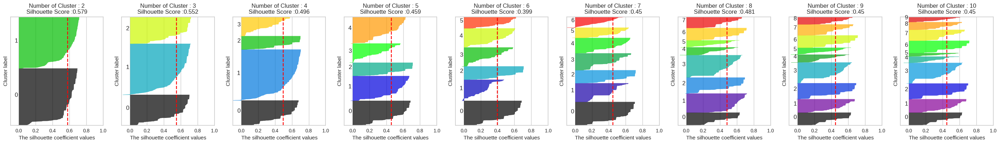

In [ ]:
visualize_silhouette([2, 3, 4, 5, 6, 7, 8, 9, 10], df_pca)

In [ ]:
# Train Kmeans model with 4 Clusters using df_pca
kmeans = KMeans(n_clusters=2, max_iter=100)
kmeans.fit(df_pca)

KMeans(max_iter=100, n_clusters=2)

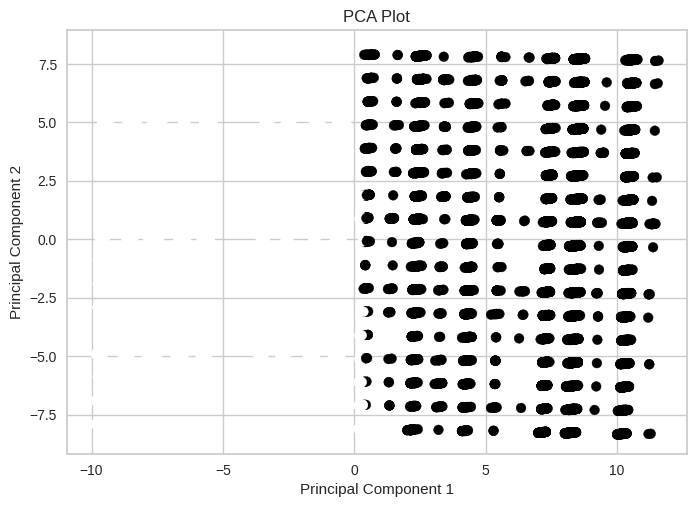

In [ ]:
# Plot PCA Model using Generated clusters
plt.scatter(df_pca[:, 0], df_pca[:, 1], c=kmeans.labels_)
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('PCA Plot')
plt.show()

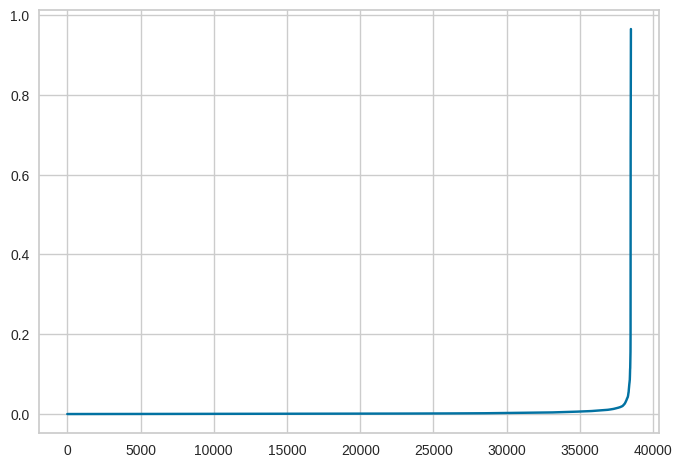

In [ ]:
from sklearn.neighbors import NearestNeighbors

neigh = NearestNeighbors(n_neighbors=5)
nbrs = neigh.fit(df_pca)
distances, indices = nbrs.kneighbors(df_pca)
distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.plot(distances)

In [ ]:
import numpy as np
import pandas as pd
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score

# Define parameter grid
eps_values = np.linspace(0.005, 0.2)
min_samples_values = list(range(2, 200))

best_score = -1
best_params = None
best_labels = None

for eps in eps_values:
    for min_samples in min_samples_values:
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        labels = dbscan.fit_predict(df_pca)

        # Check if the number of clusters is less than 5 (excluding noise points)
        num_clusters = len(set(labels)) - (1 if -1 in labels else 0)

        if 1 < num_clusters < 10:  # At least 2 clusters but fewer than 5
            score = silhouette_score(df_pca, labels) if num_clusters > 1 else -1  # Avoid single-cluster cases

            if score > best_score:
                best_score = score
                best_params = {'eps': eps, 'min_samples': min_samples}
                best_labels = labels

print("Best parameters:", best_params)
print("Best silhouette score:", best_score)

In [ ]:
# Train DBSCAN Model
from sklearn.cluster import DBSCAN

dbscan = DBSCAN(eps=0.1, min_samples=100)
dbscan.fit(df_pca)

DBSCAN(eps=0.1, min_samples=100)

In [ ]:
# Output silhouette Score
from sklearn.metrics import silhouette_score
silhouette_score(df_pca, dbscan.labels_)

0.6207215595292312

In [ ]:
# Print number of clusters
n_clusters_ = len(set(dbscan.labels_)) - (1 if -1 in dbscan.labels_ else 0)
n_clusters_

87

# Profiling / Describing the Clusters

In [ ]:
# Fetch the K-means cluster labels
cluster_labels = kmeans.labels_

In [ ]:
# Locate indices from df_non_outliers and store created clusters
df_non_outliers['Cluster'] = cluster_labels

<ipython-input-318-79f203b01c6e>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_non_outliers['Cluster'] = cluster_labels


In [ ]:
df_non_outliers.info()

<class 'pandas.core.frame.DataFrame'>
Index: 38484 entries, 0 to 41543
Data columns (total 70 columns):
 #   Column                                                      Non-Null Count  Dtype 
---  ------                                                      --------------  ----- 
 0   Total Household Income                                      38484 non-null  int64 
 1   Region                                                      38484 non-null  object
 2   Total Food Expenditure                                      38484 non-null  int64 
 3   Agricultural Household indicator                            38484 non-null  int64 
 4   Bread and Cereals Expenditure                               38484 non-null  int64 
 5   Total Rice Expenditure                                      38484 non-null  int64 
 6   Meat Expenditure                                            38484 non-null  int64 
 7   Total Fish and  marine products Expenditure                 38484 non-null  int64 
 8   Fruit Expen

In [ ]:
# Profiling columns
expenditure_columns = ['Total Food Expenditure', 'Restaurant and hotels Expenditure',
                                'Housing and water Expenditure', 'Alcoholic Beverages Expenditure',
                                'Tobacco Expenditure', 'Clothing, Footwear and Other Wear Expenditure',
                                'Miscellaneous Goods and Services Expenditure', 'Special Occasions Expenditure', 'Medical Care Expenditure',
                                'Education Expenditure', 'Communication Expenditure', 'Transportation Expenditure', 'Crop Farming and Gardening expenses',
                                'Total_Essential_Spending', 'Total_NonEssential_Spending', 'Total Expenditure']

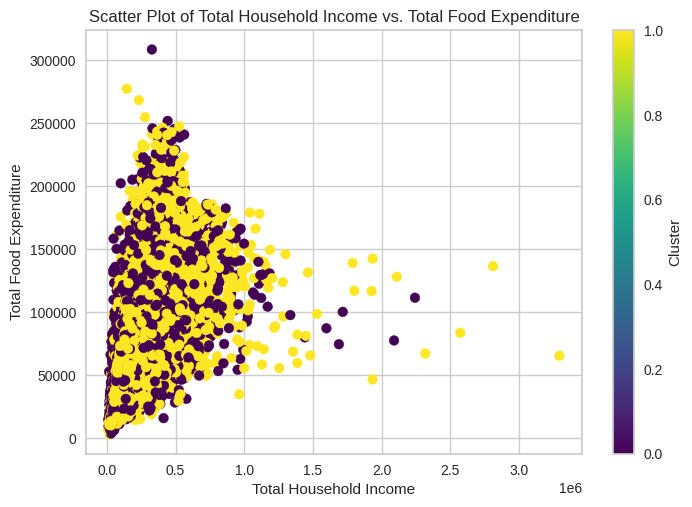

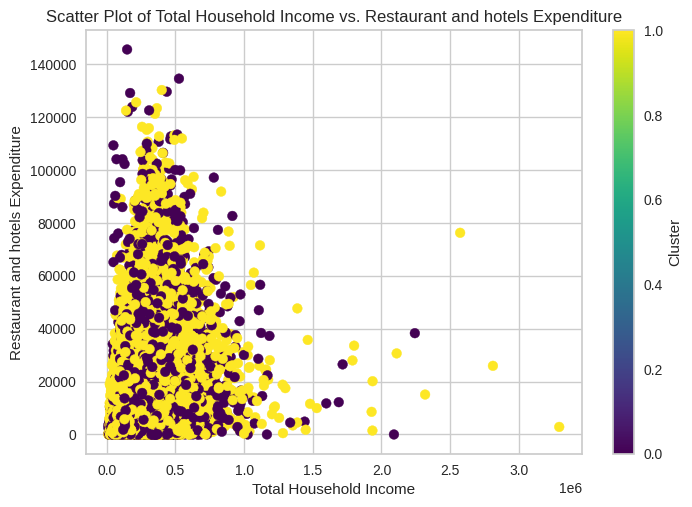

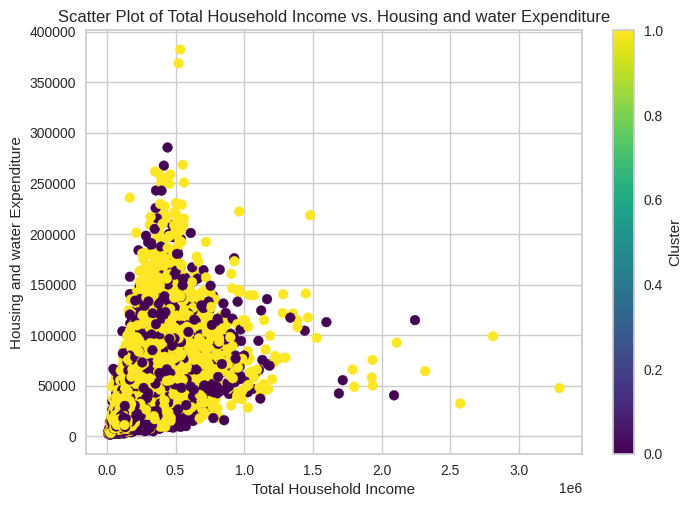

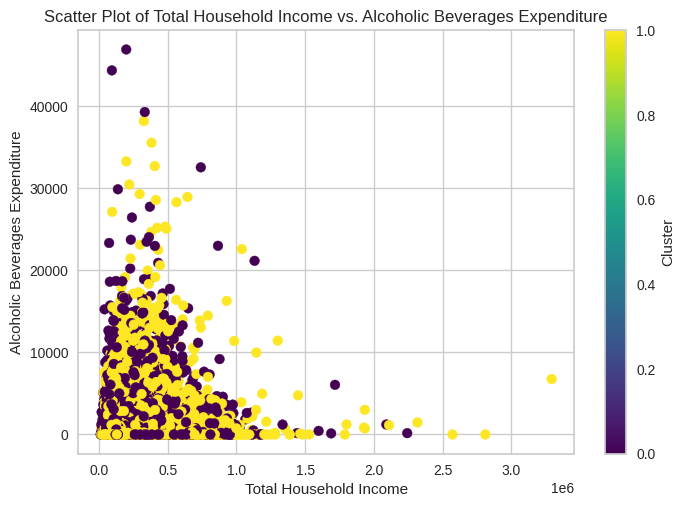

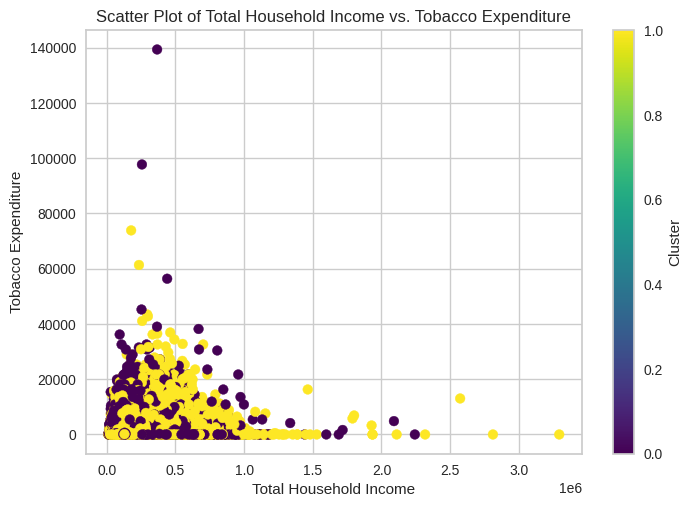

...

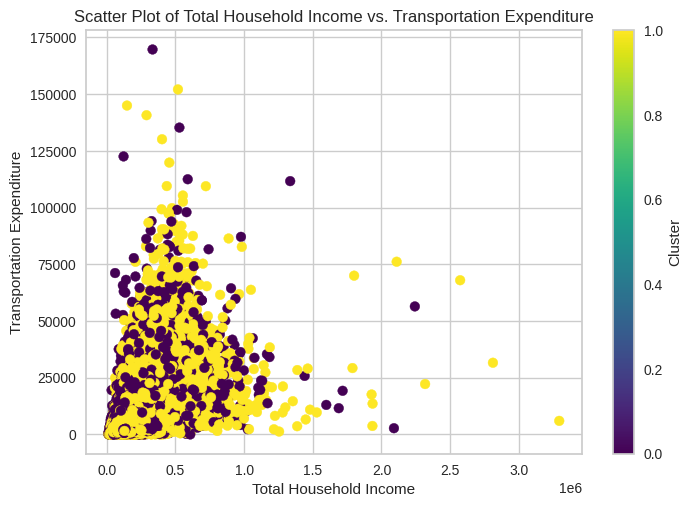

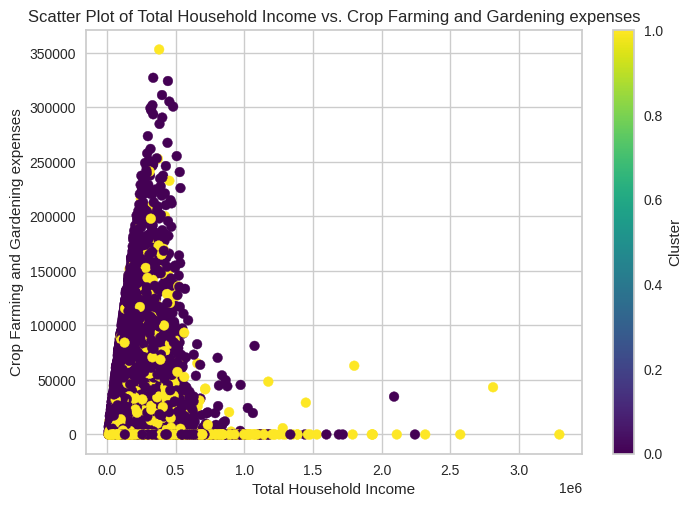

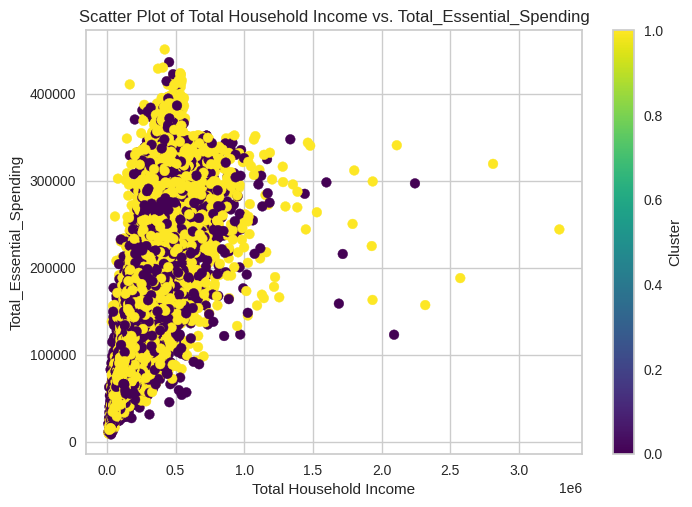

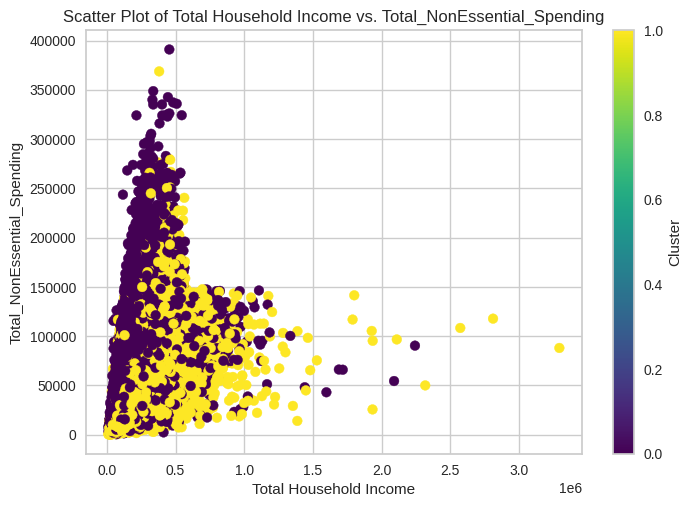

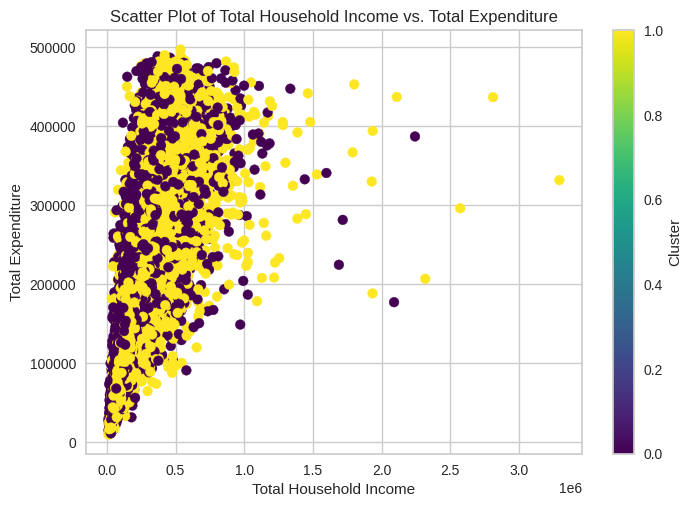

In [ ]:
# Scatter plot of Total Household Income versus each column in expenditure columns. Color code and label the dots based on 'Cluster' column
for column in expenditure_columns:
    plt.scatter(df_non_outliers['Total Household Income'], df_non_outliers[column], c=df_non_outliers['Cluster'], cmap='viridis')
    plt.xlabel('Total Household Income')
    plt.ylabel(column)
    plt.title(f'Scatter Plot of Total Household Income vs. {column}')
    plt.colorbar(label='Cluster')
    plt.show()

In [ ]:
# Display Mean values for each expenditure column, group by cluster
df_non_outliers.groupby('Cluster')[expenditure_columns].mean()

,Total Food Expenditure,Restaurant and hotels Expenditure,Housing and water Expenditure,Alcoholic Beverages Expenditure,Tobacco Expenditure,"Clothing, Footwear and Other Wear Expenditure",Miscellaneous Goods and Services Expenditure,Special Occasions Expenditure,Medical Care Expenditure,Education Expenditure,Communication Expenditure,Transportation Expenditure,Crop Farming and Gardening expenses,Total_Essential_Spending,Total_NonEssential_Spending,Total Expenditure
Cluster,,,,,,,,,,,,,,,,
0,71940.354154,9637.801879,24207.324629,1061.568002,2343.908210,3619.868843,8653.858754,3656.483185,3652.932740,4497.016073,2142.351929,7763.021662,20098.983630,114203.001187,49072.472502,163275.473689
1,81164.167762,14591.900186,36861.363009,956.005585,2126.165517,4249.354906,11046.475361,4374.255804,6291.606767,5502.578789,3583.590013,10043.025624,3026.748357,143446.331965,40370.905716,183817.237681


In [ ]:
# Display Counts per Region, group by cluster
df_non_outliers.groupby('Cluster')['Region'].value_counts()

Cluster  Region                   
0         ARMM                        1635
         VI - Western Visayas         1469
         IVA - CALABARZON             1460
         II - Cagayan Valley          1357
         V - Bicol Region             1353
         VIII - Eastern Visayas       1271
         XI - Davao Region            1250
         VII - Central Visayas        1202
         XII - SOCCSKSARGEN           1187
         III - Central Luzon          1161
         I - Ilocos Region            1086
         IX - Zasmboanga Peninsula    1048
         CAR                          1032
         X - Northern Mindanao        1008
         NCR                           978
         Caraga                        972
         IVB - MIMAROPA                751
1        NCR                          2242
         IVA - CALABARZON             2222
         III - Central Luzon          1776
         VI - Western Visayas         1252
         VII - Central Visayas        1162
         I - Ilocos Region            1144
         XI - Davao Region            1049
         V - Bicol Region             1037
         VIII - Eastern Visayas        976
         XII - SOCCSKSARGEN            848
         X - Northern Mindanao         789
         Caraga                        741
         II - Cagayan Valley           727
         IX - Zasmboanga Peninsula     689
          ARMM                         601
         CAR                           563
         IVB - MIMAROPA                446
Name: count, dtype: int64

0   Total Household Income                                      38484 non-null  float64
 1   Region                                                      38484 non-null  int64  
 2   Agricultural Household indicator                            38484 non-null  int64  
 3   Household Head Marital Status                               38484 non-null  int64  
 4   Household Head Highest Grade Completed                      38484 non-null  int64  
 5   Household Head Occupation                                   38484 non-null  int64  
 6   Total Number of Family members                              38484 non-null  float64
 7   House Floor Area                                            38484 non-null  float64
 8   Total Expenditure                                           38484 non-null  float64
 9   Household_Appliances                                        38484 non-null  float64
 10  Electronic_Appliances                                       38484 non-null  float64
 11  Number of Dependencies                                      38484 non-null  float64
 12  Main Source of Income_Other sources of Income               38484 non-null  bool   
 13  Main Source of Income_Wage/Salaries                         38484 non-null  bool   
 14  Household Head Sex_Male                                     38484 non-null  bool   
 15  Household Head Job or Business Indicator_With Job/Business

In [ ]:
df_non_outliers.groupby('Cluster')['Agricultural Household indicator'].value_counts()

Cluster  Agricultural Household indicator
0        0                                   11064
         1                                    7976
         2                                    1180
1        0                                   14974
         2                                    2420
         1                                     870
Name: count, dtype: int64

In [ ]:
df_non_outliers.groupby('Cluster')['Household Head Marital Status'].value_counts()

Cluster  Household Head Marital Status
0        Married                          16952
         Widowed                           1842
         Single                             829
         Divorced/Separated                 590
         Annulled                             7
1        Married                          11962
         Widowed                           4536
         Single                            1006
         Divorced/Separated                 758
         Annulled                             1
         Unknown                              1
Name: count, dtype: int64

In [ ]:
df_non_outliers.groupby('Cluster')['Household Head Highest Grade Completed'].value_counts()

Cluster  Household Head Highest Grade Completed
0        3                                         5575
         2                                         4220
         4                                         4146
         5                                         2443
         7                                         1681
         6                                         1226
         0                                          854
         8                                           63
         1                                           12
1        4                                         4948
         2                                         3225
         3                                         3117
         5                                         2327
         7                                         2288
         6                                         1941
         0                                          370
         8                                           45
         1                                            3
Name: count, dtype: int64

In [ ]:
df_non_outliers.groupby('Cluster')['Household Head Occupation'].value_counts()

Cluster  Household Head Occupation                                           
0        Agriculture, forestry, and fishing                                      13188
         Construction                                                             2914
         Government and Public Service                                            1270
         Administrative and Support Service Activities                            1200
         Accommodation and food service activities                                 532
         Education                                                                 368
         Electricity, gas, steam and air conditioning supply                       238
         Financial and insurance activities                                        218
         Arts, Entertainment and Recreation                                        205
         Human Health and Social Work Activities                                    78
         Directors and chief executives of corporations                              9
1        Uncategorized                                                            6734
         Transportation and storage                                               3955
         Wholesale and retail trade; repair of motor vehicles and motorcycles     3801
         Manufacturing                                                            1887
         Other service activities                                                 1188
         Human Health and Social Work Activities                                   232
         Mining and quarrying                                                      178
         Professional, Scientific and Technical Activities                         135
         Information and communication                                              71
         Water supply, sewerage, waste management and remediation activities        32
         Workers reporting occupations unidentifiable or inadequately defined       29
         Real estate activities                                                     22
Name: count, dtype: int64

In [ ]:
# df_non_outliers.groupby('Cluster')[['Total Number of Family members', 'House Floor Area', 'Number of Dependencies']].mean()
df_non_outliers.groupby('Cluster')[['Total Number of Family members', 'House Floor Area']].mean()

,Total Number of Family members,House Floor Area
Cluster,,
0,4.782493,47.787587
1,4.314444,55.334866


In [ ]:
# Household Head Sex_Male
df_non_outliers.groupby('Cluster')['Household Head Sex_Male'].value_counts()

Cluster  Household Head Sex_Male
0        True                       18161
         False                       2059
1        True                       12026
         False                       6238
Name: count, dtype: int64